# Train deconv GAN


In [1]:
import os
import re
import numpy as np
import pandas as pd
import skimage
import skimage.io
import time

import torch
from torch.utils.data import DataLoader

# 1) Load data

In [2]:
# he NLST
he_nlst_folder = "../data/he/"
he_nlst = [_ for _ in os.listdir(he_nlst_folder) if _.endswith(".png")]

# he MDACC
he_mdacc_folder = "../data/HE_unlabeled/"
he_mdacc = [_ for _ in os.listdir(he_mdacc_folder) if _.endswith(".png")]

# ihc (ori)
ihc_ori = []
for folder in ["CD8", "CD3", "CD68", "PD-L1"]:
    ihc_ori.extend([os.path.join("../data", folder, "ori", _) for _ in os.listdir(os.path.join("../data", folder, "ori"))
                   if _.endswith(".png")])
np.random.seed(1243)
ihc_ori = np.random.choice(ihc_ori, len(he_nlst), replace=False)

# ihc (h channel)
ihc_h_folder = "../data/IHC_H_channel/"
ihc_h = [_ for _ in os.listdir(ihc_h_folder) if _.endswith(".png")]

# Create image dict
he_nlst.sort()
he_mdacc.sort()
ihc_ori.sort()
ihc_h.sort()

image_dict = dict()
slides_he = []
slides_ihc = []
for index in he_nlst:
    _dict = dict()
    _dict['image'] = skimage.io.imread(os.path.join(he_nlst_folder, index))
    _dict['target'] = None
    _dict['image_path'] = os.path.join(he_nlst_folder, index)
    if index[0] == "N":
        _dict['magnitude'] = 20
    else:
        _dict['magnitude'] = 40
    _dict['type'] = "he"
    image_dict[index] = _dict
    slides_he.append(index.split("_")[0])
'''
for index in he_mdacc:
    _dict = dict()
    _dict['image'] = skimage.io.imread(os.path.join(he_mdacc_folder, index))
    _dict['target'] = None
    _dict['image_path'] = os.path.join(he_mdacc_folder, index)
    _dict['magnitude'] = 20
    _dict['type'] = "he"
    image_dict[index] = _dict
    slides_he.append(index.split("_")[0])
'''
for index in ihc_ori:
    _dict = dict()
    _dict['image'] = skimage.io.imread(index)
    _dict['target'] = None
    _dict['image_path'] = index
    _dict['magnitude'] = 20
    _dict['type'] = "ihc"
    image_dict[index] = _dict
    slides_ihc.append(index.split("/")[-1].split("_")[0])
for index in ihc_h:
    _dict = dict()
    _dict['image'] = skimage.io.imread(os.path.join(ihc_h_folder, index))
    _dict['target'] = None
    _dict['image_path'] = os.path.join(ihc_h_folder, index)
    _dict['magnitude'] = 20
    _dict['type'] = "ihc"
    image_dict[index] = _dict
    slides_ihc.append(index.split("_")[0])

slides_he = list(set(slides_he))
slides_ihc = list(set(slides_ihc))
slides_he.sort()
slides_ihc.sort()

# Split train, val, test
he_indexes = []
he_indexes.extend(he_nlst)
'''he_indexes.extend(he_mdacc)'''
np.random.seed(81020)
slides_he_train = np.random.choice(slides_he, int(len(slides_he)*0.85), replace=False)
slides_he_rest = [_ for _ in slides_he if _ not in slides_he_train]
np.random.seed(81020)
slides_he_val = np.random.choice(slides_he_rest, int(len(slides_he_rest)*0.5), replace=False)
slides_he_test = [_ for _ in slides_he_rest if _ not in slides_he_val]
he_indexes_train = [_ for _ in he_indexes if _.split("_")[0] in slides_he_train]
he_indexes_val = [_ for _ in he_indexes if _.split("_")[0] in slides_he_val]
he_indexes_test = [_ for _ in he_indexes if _.split("_")[0] in slides_he_test]
np.random.seed(81020)
slides_ihc_train = np.random.choice(slides_ihc, int(len(slides_ihc)*0.85), replace=False)
slides_ihc_rest = [_ for _ in slides_ihc if _ not in slides_ihc_train]
np.random.seed(81020)
slides_ihc_val = np.random.choice(slides_ihc_rest, int(len(slides_ihc_rest)*0.5), replace=False)
slides_ihc_test = [_ for _ in slides_ihc_rest if _ not in slides_ihc_val]
ihc_ori_indexes_train = [_ for _ in ihc_ori if _.split("/")[-1].split("_")[0] in slides_ihc_train]
ihc_ori_indexes_val = [_ for _ in ihc_ori if _.split("/")[-1].split("_")[0] in slides_ihc_val]
ihc_ori_indexes_test = [_ for _ in ihc_ori if _.split("/")[-1].split("_")[0] in slides_ihc_test]
ihc_h_indexes_train = [_ for _ in ihc_h if _.split("_")[0] in slides_ihc_train]
ihc_h_indexes_val = [_ for _ in ihc_h if _.split("_")[0] in slides_ihc_val]
ihc_h_indexes_test = [_ for _ in ihc_h if _.split("_")[0] in slides_ihc_test]

In [3]:
print('# he_indexes_train: {}\n# he_indexes_val: {}\n# he_indexes_test: {}\n'.format(len(he_indexes_train), 
                                                                                     len(he_indexes_val), 
                                                                                     len(he_indexes_test)))
print('# ihc_ori_indexes_train: {}\n# ihc_ori_indexes_val: {}\n# ihc_ori_indexes_test: {}\n'.format(len(ihc_ori_indexes_train), 
                                                                                     len(ihc_ori_indexes_val), 
                                                                                     len(ihc_ori_indexes_test)))
print('# ihc_indexes_train: {}\n# ihc_indexes_val: {}\n# ihc_indexes_test: {}\n'.format(len(ihc_h_indexes_train), 
                                                                                     len(ihc_h_indexes_val), 
                                                                                     len(ihc_h_indexes_test)))

# he_indexes_train: 368
# he_indexes_val: 43
# he_indexes_test: 32

# ihc_ori_indexes_train: 360
# ihc_ori_indexes_val: 43
# ihc_ori_indexes_test: 40

# ihc_indexes_train: 500
# ihc_indexes_val: 40
# ihc_indexes_test: 60



In [4]:
# Define stain_OD_norm
stain_OD = [[0.644211, 0.716556, 0.266844],  # Hematoxylin
            [0.092789, 0.964111, 0.283111],  # Eosin
            [0.268000, 0.570000, 0.776000],  # DAB
            [1.000000, 0.000000, 0.000000],  # Bg-r
            [0.000000, 1.000000, 0.000000],  # Bg-g
            [0.000000, 0.000000, 1.000000],  # Bg-b
           ]
stain_OD_norm = []
for r in stain_OD:
    stain_OD_norm.append(r/np.linalg.norm(r))
stain_OD_norm = torch.tensor(np.asarray(stain_OD_norm))
IMAGE_SHAPE = 512

# 2) Create and check data loader

In [5]:
import matplotlib.pyplot as plt
from matplotlib.patches import Circle, Wedge, Polygon, Rectangle
import numpy as np
import math
import skimage
import skimage.transform

import torch
import torch.utils
import torch.utils.data

from utils_image import rgba2rgb, split_masks, Crop, binary_mask_to_polygon
from segmentation_functions import channel_deconvolution

def normalize(image, inverse=False):
    if not inverse:
        image = image/255.
    else:
        image = np.clip(image*255, 0, 255).astype(np.uint8)
    return image

def augmentor(image, label=None, stain=None):
    """Do image shape and color augmentation.
    
    Args:
        image: [h, w, c], float
    """
    n_channels = image.shape[2]
    
    if stain is not None:
        stain = stain/255.
    
    # Shape augmentation
    if np.random.uniform(0, 1) < 0.8:
        # Projective transform
        scale = np.random.uniform(0.9, 1.1)
        aspect_ratio = np.random.uniform(0.9, 1.1)
        rotation = np.random.uniform(-0.1, 0.1)
        translationX = np.random.uniform(-10, 10)
        translationY = np.random.uniform(-10, 10)
        g = np.random.uniform(-0.001, 0.001)
        h = np.random.uniform(-0.001, 0.001)

        matrix = np.array([[math.cos(rotation) * scale * aspect_ratio, -math.sin(rotation), translationX],
                          [math.sin(rotation), math.cos(rotation) * scale / aspect_ratio, translationY],
                          [g, h, 1]])
        tform = skimage.transform.ProjectiveTransform(matrix=matrix)
        image_aug = np.zeros_like(image, dtype=np.float)
        for ch in range(n_channels):
            image_aug[..., ch] = skimage.transform.warp(image[..., ch], tform, preserve_range=True)
        
        image = image_aug
        
        if label is not None:
            label_aug = np.zeros_like(label, dtype=np.int)
            label_aug = skimage.transform.warp(label, tform, preserve_range=True, order=0)
            label = label_aug
            
        if stain is not None:
            stain_aug = np.zeros_like(stain, dtype=np.float)
            for ch in range(n_channels):
                stain_aug[..., ch] = skimage.transform.warp(stain[..., ch], tform, preserve_range=True)
            stain = stain_aug
            
    if np.random.uniform(0, 1) < 0.5:
        # Do 50% vertical flipping
        image = image[::-1, :, :]
        
        if label is not None:
            label = label[::-1, :]
            
        if stain is not None:
            stain = stain[::-1, :]
    if np.random.uniform(0, 1) < 0.5:
        # Do 50% horizontal flipping
        image = image[:, ::-1, :]
        
        if label is not None:
            label = label[:, ::-1]
            
        if stain is not None:
            stain = stain[:, ::-1]

    # Color augmentation
    # 1) add a global shifting for all channels
    image = image + np.random.randn(1)[0] * 0.01

    # 2) add a shifting & variance for each channel
    for ch in range(n_channels):
        image[:, :, ch] = image[:, :, ch] * np.clip(np.random.randn(1)[0] * 0.01 + 1, 0.95, 1.05) + np.random.randn(1)[0] * 0.01
        
    return image, label

class Dataset(torch.utils.data.Dataset):
    __initialized = False
    def __init__(self, indexes_A, indexes_B, image_dict,
                 augmentation=False, crop_size=256):
        """
        Args:
            indexes: index used for image_dict
            indexes_A: IHC + HE
            indexes_B: IHC H channel
        """
        self.indexes_A = indexes_A
        self.indexes_B = indexes_B
        self.length_B = len(indexes_B)
        self.image_dict = image_dict
        self.augmentation = augmentation
        self.crop_size = crop_size
        self.__initialized = True

    def __len__(self):
        """Denotes the number of samples"""
        return len(self.indexes_A)
    
    def __getitem__(self, index):
        """Generate one batch of data.
        
        Returns:
            idx: indexes of samples (long)
        """
        # Generate indexes of the batch
        data_index_A = self.indexes_A[index]
        np.random.seed()
        idx_B = np.random.choice(np.arange(self.length_B))
        data_index_B = self.indexes_B[idx_B]
        
        # Generate data
        image_A, _ = self.__data_generation(data_index_A, index)
        image_B, _ = self.__data_generation(data_index_B, idx_B, h_channel=True)
        
        '''
        data = dict()
        data['A'] = image_A
        data['B'] = image_B
        data['A_paths'] = self.image_dict[data_index_A]['image_path']
        data['B_paths'] = self.image_dict[data_index_B]['image_path']
        data['target_B'] = target_B
        data['stain_A'] = stain_A
        '''

        return image_A, image_B, self.image_dict[data_index_A]['type']
    
    def __data_generation(self, index, idx=0, h_channel=False):
        """Generates image containing batch_size samples.
        
        Args:
            h_channel: if True, return deconvoluted single channel image
        
        Returns:
            image: [b, ch, h, w]
        """
        image = rgba2rgb(self.image_dict[index]['image'])
        target = self.image_dict[index]['target']
        image_path = self.image_dict[index]['image_path']
        
        # Process target
        if target is not None:
            target = normal_cell_to_stroma(rgba2rgb(target))
            objects = split_masks(target, val_to_label=self.val_to_label, dtype='float')
            target = np.transpose(np.array([x['mask'] for x in objects]), (1, 2, 0))
            labels = [x['label'] for x in objects]
        
        # Augmentation
        if h_channel:
            _, image, _, _ = channel_deconvolution(image, "HDB", to_normalize=False)
            image = np.clip(image, 0, None)
            image = image[..., np.newaxis]
        elif self.augmentation:
            image, target = augmentor(image/255., target)
        else:
            image = image/255.
            
        # Resize
        if self.image_dict[index]['magnitude'] == 20:
            image = skimage.transform.rescale(image, 2, preserve_range=True, multichannel=True, order=1)
            if target is not None:
                target = skimage.transform.rescale(target, 2, preserve_range=True, multichannel=True, order=0)
                
        # Random crop
        image, target = Crop(size=(self.crop_size, self.crop_size), pos='random')([image, target])
        
        # Padding
        if image.shape[0] < self.crop_size:
            image_temp = np.zeros((self.crop_size, self.crop_size, image.shape[2]))
            start = int((self.crop_size - image.shape[0])/2)
            image_temp[start:start + image.shape[0], start:start + image.shape[0], :] = image
            image = image_temp
            if target is not None:
                target[start:start + image.shape[0], start:start + image.shape[0], :] = target
        
        # Filter small objects & create target for MaskRCNN
        if target is not None:
            non_zeros = [(target[..., i], labels[i]) for i in range(len(labels)) if np.sum(target[..., i]) > 10]
            if len(non_zeros):
                target, labels = zip(*non_zeros)
            else:
                target = [np.ones((self.crop_size, self.crop_size))]
                labels = [0]
            target = objects_to_tensor_targets(target, labels, idx)
        
        image = torch.tensor(np.transpose(image, (2, 0, 1)).astype(float))
        
        return image, target
    
    def display(self, indices=None):
        if indices is None:
            indices = range(len(self))
        elif isinstance(indices, int):
            indices = np.random.choice(len(self), indices)
        for i in indices:
            data = self[i]
            image = data['B']
            targets = data['target_B']
            image = image.permute(1, 2, 0).numpy()
            if targets is not None:
                bboxes = targets['boxes'].numpy()
                labels = targets['labels'].numpy()
                masks = targets['masks'].numpy()
            
            fig, ax = plt.subplots(1, 2, figsize=(6 * 2, 6))
            ax[0].imshow(np.array(np.clip(image * 255, 0, 255), dtype=np.uint8))
            ax[1].imshow(np.array(np.clip(image * 255, 0, 255), dtype=np.uint8))
            if targets is not None:
                color = self.label_to_val
                for i, (mask, bbox, label) in enumerate(zip(masks, bboxes, labels)):
                    c = tuple([1.0*_/255 for _ in color[label]]) if label else (0, 0, 0)
                    polygon = binary_mask_to_polygon(mask)
                    for verts in polygon:
                        p = Polygon(np.array(verts[:, ::-1]), facecolor="none", edgecolor=c)
                        ax[1].add_patch(p)
                    y1, x1, y2, x2 = bbox
                    b = Rectangle((y1, x1), (y2-y1), (x2-x1), linewidth=2,
                                  alpha=0.5, linestyle="solid", edgecolor=c, facecolor="none")
                    ax[1].add_patch(b)

            plt.show()
            
# def collate_fn(batch):
#     return list(batch)

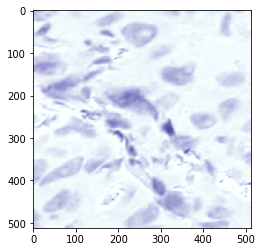

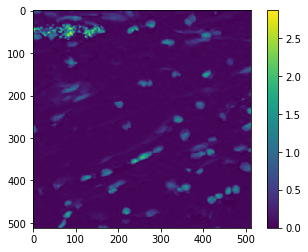

('ihc',)


In [6]:
# Generator
train_set = Dataset(he_indexes_train+ihc_h_indexes_train, ihc_ori_indexes_train, image_dict, augmentation=True, crop_size=IMAGE_SHAPE)
train_loader = torch.utils.data.DataLoader(train_set, batch_size=1, shuffle=True, num_workers=1, 
                                          )  # collate_fn=collate_fn)
for image, real_h, stain_type in train_loader:
    plt.imshow(normalize(np.transpose(image[0].numpy(), (1, 2, 0)), inverse=True))
    plt.show()
    plt.imshow(real_h[0].numpy()[0])
    plt.colorbar()
    plt.show()
    print(stain_type)
    break

# 3) Create model

In [7]:
import math

import torch
import torch.nn as nn
import torch.nn.functional as F

######## Activations ########

class MishFunction(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x):
        ctx.save_for_backward(x)
        return x * torch.tanh(F.softplus(x))   # x * tanh(ln(1 + exp(x)))

    @staticmethod
    def backward(ctx, grad_output):
        x = ctx.saved_variables[0]
        sigmoid = torch.sigmoid(x)
        tanh_sp = torch.tanh(F.softplus(x)) 
        return grad_output * (tanh_sp + x * sigmoid * (1 - tanh_sp * tanh_sp))

class Mish(nn.Module):
    def forward(self, x):
        return MishFunction.apply(x)
    
######## Blocks ########
    
class ResidualBlock(nn.Module):
    def __init__(self, channels, activation=nn.PReLU()):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(channels)
        self.activation = activation
        self.conv2 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(channels)

    def forward(self, x):
        residual = self.conv1(x)
        residual = self.bn1(residual)
        residual = self.activation(residual)
        residual = self.conv2(residual)
        residual = self.bn2(residual)

        return self.activation(x + residual)
    
######## Encoder ########
    
class ODEncoder(nn.Module):
    def __init__(self, activation=nn.PReLU()):
        '''
        Args:
            activation: nn.PReLU(), nn.ReLU(), nn.LeakyReLU(0.2), Mish()
        '''
        super(ODEncoder, self).__init__()
        self.block1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            activation
        )
        self.block2 = ResidualBlock(64, activation)
        self.block3 = ResidualBlock(64, activation)
        self.block4 = ResidualBlock(64, activation)
        self.block5 = ResidualBlock(64, activation)
        self.block6 = ResidualBlock(64, activation)
        self.block7 = nn.Sequential(
            nn.Conv2d(64, 6, kernel_size=3, padding=1),
            nn.BatchNorm2d(6)
        )
        
        self.block8 = nn.Sequential(
            nn.Conv2d(64, 32, kernel_size=3, padding=1),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.BatchNorm2d(32),
            activation,
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.BatchNorm2d(32),
            activation,
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.BatchNorm2d(32),
            activation,
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.BatchNorm2d(32),
            activation,
            nn.AdaptiveMaxPool2d((1, 1))
        )
        self.block9 = nn.Sequential(
            nn.Linear(32, 3*3),
            activation
        )
        self.block10 = nn.Sequential(
            nn.Linear(32, 2), 
            activation
        )

    def forward(self, x):
        block1 = self.block1(x)
        block2 = self.block2(block1)
        block3 = self.block3(block2)
        block4 = self.block4(block3)
        block5 = self.block5(block4)
        block6 = self.block6(block5)
        block7 = self.block7(block1 + block6)
        
        block8 = self.block8(block1)
        block8 = block8.view(-1, 32)
        block9 = self.block9(block8)
        block9 = block9.view(-1, 3, 3)
        block9 = torch.sqrt(F.softmax(block9, -1))
        block10 = self.block10(block8)

        return nn.ReLU()(block7), block9, block10
    
def reconstruct(ODs, stain_OD_norm, device):
    '''Reconstruct image from different stains
    
    Args:
        ODs: [B, n_stains, H, W]
        stain_OD_norm: [n_stains, 3 (R, G, B)] or [B, n_stains, 3 (R, G, B)]
    '''
    if not isinstance(ODs, torch.Tensor):
        ODs = torch.tensor(ODs).float()
    if not isinstance(stain_OD_norm, torch.Tensor):
        stain_OD_norm = torch.tensor(stain_OD_norm)
    if len(ODs.size()) != 4:
        raise Exception("ODs should be of shape [B, n_stains, H, W]")
    if len(stain_OD_norm.size()) == 2:
        # If the batch of images have the same stain_OD_norm
        ODs = ODs.permute(0, 2, 3, 1)
        ODs = ODs.to(device)
        stain_OD_norm = stain_OD_norm.to(device)
        stain_OD_norm = stain_OD_norm.float()
        reconstructed = torch.matmul(ODs, stain_OD_norm)
        reconstructed = torch.exp(torch.neg(reconstructed.permute(0, 3, 1, 2)))
    elif len(stain_OD_norm.size()) == 3:
        # If the batch of images have different stain_OD_norms
        size = ODs.size()
        ODs = ODs.view(size[0], size[1], size[2] * size[3])
        ODs = ODs.permute(0, 2, 1)
        ODs = ODs.to(device)
        stain_OD_norm = stain_OD_norm.to(device)
        stain_OD_norm = stain_OD_norm.float()
        reconstructed = torch.bmm(ODs, stain_OD_norm)  #[B, H*W, 3]
        reconstructed = torch.exp(torch.neg(reconstructed.permute(0, 2, 1)))
        reconstructed = reconstructed.view(size[0], 3, size[2], size[3])
    return reconstructed

In [8]:
# Losses
import torch
from torch import nn
from torchvision.models.vgg import vgg16
from torchvision.transforms import Normalize

class ReconstructionLoss(nn.Module):
    def __init__(self, weight=None):
        super(ReconstructionLoss, self).__init__()
        vgg = vgg16(pretrained=True)
        loss_network = nn.Sequential(*list(vgg.features)[:31]).eval()
        for param in loss_network.parameters():
            param.requires_grad = False
        self.loss_network = loss_network
        self.mse_loss = nn.MSELoss()
        self.mean=[0.485, 0.456, 0.406]
        self.std=[0.229, 0.224, 0.225]
        if weight is None:
            self.weight_image_loss = 10
            self.weight_perceptual_loss = 1
            self.weight_bg_penalty = 0.1
            self.weight_stain_penalty = 0.1
            self.weight_h_sparsity = 0.1
            self.weight_e_penalty = 0.1
            self.weight_cov_penalty = 1
        else:
            self.weight_image_loss = weight[0]
            self.weight_perceptual_loss = weight[1]
            self.weight_bg_penalty = weight[2]
            self.weight_stain_penalty = weight[3]
            self.weight_h_sparsity = weight[4]
            if len(weight) > 5:
                self.weight_e_penalty = weight[5]
            else:
                self.weight_e_penalty = 0
            if len(weight) > 6:
                self.weight_cov_penalty = weight[6]
            else:
                self.weight_cov_penalty = 0
        
    def forward(self, recon_images_exact, recon_images_valid, target_images, ODs, stain_types):
        '''
        Args:
            recon_images: in shape [b, c, h, w]. exact: use all channels; valid: use valid channels
        '''
        # Image Loss
        image_loss = self.mse_loss(recon_images_exact, target_images)
        
        # Perceptual Loss
        recon_images_n = recon_images_valid.clone()
        target_images_n = target_images.clone()
        for ch in range(3):
            recon_images_n[:, ch, ...] = -(recon_images_valid[:, ch, ...] - self.mean[ch])/self.std[ch]
            target_images_n[:, ch, ...] = -(target_images[:, ch, ...] - self.mean[ch])/self.std[ch]
        perceptual_loss = self.mse_loss(self.loss_network(recon_images_n), 
                                        self.loss_network(target_images_n))
        # Background penalty
        for i, stain_type in enumerate(stain_types):
            if i != 0:
                if stain_type == "he":
                    bg_penalty += torch.mean(ODs[i, [2, 3, 4, 5], ...])
                elif stain_type == "ihc":
                    bg_penalty += torch.mean(ODs[i, [1, 3, 4, 5], ...])
            else:
                if stain_type == "he":
                    bg_penalty = torch.mean(ODs[i, [2, 3, 4, 5], ...])
                elif stain_type == "ihc":
                    bg_penalty = torch.mean(ODs[i, [1, 3, 4, 5], ...])
        bg_penalty = torch.div(bg_penalty, i + 1)
                    
        # Stain penalty
        for i, stain_type in enumerate(stain_types):
            if i != 0:
                if stain_type == "he":
                    stain_penalty += torch.mean(ODs[i, [0, 1], ...])
                elif stain_type == "ihc":
                    stain_penalty += torch.mean(ODs[i, [0, 2], ...])
            else:
                if stain_type == "he":
                    stain_penalty = torch.mean(ODs[i, [0, 1], ...])
                elif stain_type == "ihc":
                    stain_penalty = torch.mean(ODs[i, [0, 2], ...])
        stain_penalty = torch.div(stain_penalty, i + 1)
        
        # H sparsity
        h_sparsity = torch.mean(ODs[:, 0, ...])
        
        # E penalty
        j = 0
        e_penalty = 0
        for i, stain_type in enumerate(stain_types):
            if stain_type == "he":
                e_penalty += torch.mean(torch.pow(ODs[i, [1], ...], 2))
                j += 1
        if j > 1:
            e_penalty = torch.div(e_penalty, j)
        
        # Covariance penalty
        cov_penalty = torch.mean(ODs[:, 0, ...] * ODs[:, 1, ...]) - torch.mean(ODs[:, 0, ...]) * torch.mean(ODs[:, 1, ...])
        
        self.image_loss = self.weight_image_loss * image_loss
        self.perceptual_loss = self.weight_perceptual_loss * perceptual_loss
        self.bg_penalty = self.weight_bg_penalty * bg_penalty
        self.stain_penalty = self.weight_stain_penalty * stain_penalty
        self.h_sparsity = self.weight_h_sparsity * h_sparsity
        self.e_penalty = self.weight_e_penalty * e_penalty
        self.cov_penalty = self.weight_cov_penalty * cov_penalty
        
        return self.image_loss + self.perceptual_loss + self.bg_penalty + self.stain_penalty + self.h_sparsity + self.e_penalty \
                 + self.cov_penalty

In [9]:
import torch

# self-defined functions
from util.image_pool import ImagePool
import networks

class DeconvGAN():
    def __init__(self, is_train=True, device="0", activation=Mish(), weight=[10, 1, 0.1, 0, 0, 0, 0], 
                lr=0.0002, beta1=0.5, save_dir="./models/", n_epochs=500, n_epochs_decay=100):
        self.is_train = is_train
        self.device = device
        self.save_dir = save_dir  # which folder to save models
        self.n_epochs = n_epochs
        self.n_epochs_decay = n_epochs_decay
        
        if self.is_train:
            self.model_names = ['G', 'D']
        else:
            self.model_names = ['G']

        # define networks 
        self.netG = ODEncoder(activation=activation)
        self.netG = self.netG.to(self.device)

        if self.is_train:  # define discriminators
            '''    Parameters:
            input_nc (int)     -- the number of channels in input images
            ndf (int)          -- the number of filters in the first conv layer
            netD (str)         -- the architecture's name: basic | n_layers | pixel
            n_layers_D (int)   -- the number of conv layers in the discriminator; effective when netD=='n_layers'
            norm (str)         -- the type of normalization layers used in the network.
            init_type (str)    -- the name of the initialization method.
            init_gain (float)  -- scaling factor for normal, xavier and orthogonal.
            gpu_ids (int list) -- which GPUs the network runs on: e.g., 0,1,2'''
            self.netD = networks.define_D(input_nc=1, ndf=64, netD="basic", n_layers_D=3,
                                          norm="instance", init_type="normal", init_gain=0.02, gpu_ids=[device])
            
        self.criterionRec = ReconstructionLoss(weight=weight).to(self.device)
        
        if self.is_train:
            self.fake_pool = ImagePool(50)
            # define loss functions
            self.criterionGAN = networks.GANLoss("lsgan").to(self.device)  # define GAN loss.
            # initialize optimizers
            self.optimizers = []
            self.optimizer_G = torch.optim.Adam(self.netG.parameters(), lr=lr, betas=(beta1, 0.999))
            self.optimizer_D = torch.optim.Adam(self.netD.parameters(), lr=lr, betas=(beta1, 0.999))
            self.optimizers.append(self.optimizer_G)
            self.optimizers.append(self.optimizer_D)
            self.schedulers = [networks.get_scheduler(optimizer, lr_policy="linear", 
                                                      n_epochs=n_epochs, n_epochs_decay=n_epochs_decay) for optimizer in self.optimizers]

    def set_input(self, data):
        """Unpack input data from the dataloader and perform necessary pre-processing steps.
        Parameters:
            input (dict): include the data itself and its metadata information.
        """
        self.images = data[0].float().to(self.device)
        self.real_hs = data[1].float().to(self.device)
        self.stain_types = data[2]

    def forward(self, val=False):
        """Run forward pass; called by both functions <optimize_parameters> and <test>."""
        if val:
            self.netG.eval()
        else:
            self.netG.train()
        self.ODs, self.stain_OD_norm_preds, self.params_lt = self.netG(self.images)
        self.fake_hs = self.params_lt[:, 0, None, None, None] * (torch.log(self.ODs[:, 0:1, ...] + 1)) + \
                       self.params_lt[:, 1, None, None, None]
        
        # Add rgb to ODs
        rgb_ODs = torch.stack([torch.tensor([[0, 0.70711, 0.70711], 
                                             [0.70711, 0, 0.70711], 
                                             [0.70711, 0.70711, 0]]) for _ in range(self.ODs.size()[0])], 0)
        self.stain_OD_norm_preds = torch.cat([self.stain_OD_norm_preds, rgb_ODs.to(self.device)], 1)
        
        self.recon_images_exact = reconstruct(self.ODs, self.stain_OD_norm_preds, self.device)
        self.recon_images_valid = torch.zeros_like(self.recon_images_exact).to(self.device)
        for i, stain_type in enumerate(self.stain_types):
            if stain_type == "he":
                self.recon_images_valid[i:i+1, ...] = reconstruct(self.ODs[i:i+1, 0:2, ...], 
                                                             self.stain_OD_norm_preds[i:i+1, 0:2, ...], self.device)
            if stain_type == "ihc":
                self.recon_images_valid[i:i+1, ...] = reconstruct(self.ODs[i:i+1, [0, 2], ...], 
                                                             self.stain_OD_norm_preds[i:i+1, [0, 2], ...], self.device)
        self.loss_rec = self.criterionRec(self.recon_images_exact, self.recon_images_valid, self.images, self.ODs, self.stain_types)
        self.image_loss = self.criterionRec.image_loss
        self.perceptual_loss = self.criterionRec.perceptual_loss
        self.bg_penalty = self.criterionRec.bg_penalty
        self.stain_penalty = self.criterionRec.stain_penalty
        self.h_sparsity = self.criterionRec.h_sparsity
        self.e_penalty = self.criterionRec.e_penalty
        self.cov_penalty = self.criterionRec.cov_penalty

    def backward_D_basic(self, netD, real, fake, val=False):
        """Calculate GAN loss for the discriminator
        Parameters:
            netD (network)      -- the discriminator D
            real (tensor array) -- real images
            fake (tensor array) -- images generated by a generator
        Return the discriminator loss.
        We also call loss_D.backward() to calculate the gradients.
        """
        # Real
        pred_real = netD(real)
        loss_D_real = self.criterionGAN(pred_real, True)
        # Fake
        pred_fake = netD(fake.detach())
        loss_D_fake = self.criterionGAN(pred_fake, False)
        # Combined loss and calculate gradients
        loss_D = (loss_D_real + loss_D_fake) * 0.5
        if not val:
            loss_D.backward()
        return loss_D

    def backward_D(self, val=False):
        """Calculate GAN loss for discriminator D_A"""
        fake_hs = self.fake_pool.query(self.fake_hs)
        self.loss_D = self.backward_D_basic(self.netD, self.real_hs, fake_hs, val=val)

    def backward_G(self, val=False):
        """Calculate the loss for generator G"""

        # GAN loss
        self.loss_gan = self.criterionGAN(self.netD(self.fake_hs), True)
        # combined loss and calculate gradients
        self.loss_G = self.loss_gan + self.loss_rec
        
        if not val:
            self.loss_G.backward()
            
    def set_requires_grad(self, nets, requires_grad=False):
        """Set requies_grad=Fasle for all the networks to avoid unnecessary computations
        Parameters:
            nets (network list)   -- a list of networks
            requires_grad (bool)  -- whether the networks require gradients or not
        """
        if not isinstance(nets, list):
            nets = [nets]
        for net in nets:
            if net is not None:
                for param in net.parameters():
                    param.requires_grad = requires_grad

    def optimize_parameters(self):
        """Calculate losses, gradients, and update network weights; called in every training iteration"""
        # forward
        self.forward()      # compute fake images and reconstruction images.
        # G
        self.set_requires_grad([self.netD], False)  # Ds require no gradients when optimizing Gs
        self.optimizer_G.zero_grad()  # set G_A and G_B's gradients to zero
        self.backward_G()             # calculate gradients for G_A and G_B
        self.optimizer_G.step()       # update G_A and G_B's weights
        # D
        self.set_requires_grad([self.netD], True)
        self.optimizer_D.zero_grad()   # set D_A and D_B's gradients to zero
        self.backward_D()      # calculate gradients for D_A
        self.optimizer_D.step()  # update D_A and D_B's weights
        
    def forward_wo_optimize_parameters(self):
        """Calculate losses in validation set, run within torch.no_grad()"""
        # forward
        self.forward(val=True)
        self.backward_G(val=True)
        self.backward_D(val=True) 
        
    def save_networks(self, epoch):
        """Save all the networks to the disk.
        Parameters:
            epoch (int) -- current epoch; used in the file name '%s_net_%s.pth' % (epoch, name)
        """
        for name in self.model_names:
            if isinstance(name, str):
                save_filename = '%s_net_%s.pth' % (epoch, name)
                save_path = os.path.join(self.save_dir, save_filename)
                net = getattr(self, 'net' + name)

                if isinstance(net, torch.nn.DataParallel):
                    torch.save(net.module.state_dict(), save_path)
                else:
                    torch.save(net.state_dict(), save_path)

    def load_networks(self, epoch):
        """Load all the networks from the disk.
        Parameters:
            epoch (int) -- current epoch; used in the file name '%s_net_%s.pth' % (epoch, name)
        """
        for name in self.model_names:
            if isinstance(name, str):
                load_filename = '%s_net_%s.pth' % (epoch, name)
                load_path = os.path.join(self.save_dir, load_filename)
                net = getattr(self, 'net' + name)
                if isinstance(net, torch.nn.DataParallel):
                    net = net.module
                print('loading the model from %s' % load_path)
                # if you are using PyTorch newer than 0.4 (e.g., built from
                # GitHub source), you can remove str() on self.device
                state_dict = torch.load(load_path, map_location=str(self.device))
                if hasattr(state_dict, '_metadata'):
                    del state_dict._metadata

                # patch InstanceNorm checkpoints prior to 0.4
                # for key in list(state_dict.keys()):  # need to copy keys here because we mutate in loop
                #     self.__patch_instance_norm_state_dict(state_dict, net, key.split('.'))
                net.load_state_dict(state_dict)
                
    def update_learning_rate(self):
        """Update learning rates for all the networks; called at the end of every epoch"""
        old_lr = self.optimizers[0].param_groups[0]['lr']
        for scheduler in self.schedulers:
            scheduler.step()

        lr = self.optimizers[0].param_groups[0]['lr']
        print('learning rate %.7f -> %.7f' % (old_lr, lr))

In [10]:
# Create model dir
model_dir = "./models/deconv-GAN-512-40X-9"
if not os.path.exists(model_dir):
    os.mkdir(model_dir)

model = DeconvGAN(is_train=True, device=torch.device("cuda:0"), save_dir=model_dir, weight=[200, 1, 10, 0, 0.1, 0.2, 0.2], 
                 lr=0.0001)

# Load model
# model.load_networks(100)

load_path = os.path.join("./models/deconv-GAN-256-40X-8/", '140_net_G.pth')
print('loading the model from %s' % load_path)
msg = model.netG.load_state_dict(state_dict=torch.load(load_path, map_location=str(model.device)), strict=False)
print(msg)
# load_path = os.path.join("./models/deconv-GAN-256-40X-7/", '560_net_D.pth')
# print('loading the model from %s' % load_path)
# model.netD.module.load_state_dict(state_dict=torch.load(load_path, map_location=str(model.device)))

initialize network with normal
loading the model from ./models/deconv-GAN-256-40X-8/140_net_G.pth
<All keys matched successfully>


# 4) Train

In [11]:
def train(model, train_loader, epoch, loss_names):
    print("Train epoch {}".format(epoch))
    hist = dict()
    for loss_name in loss_names:
        hist[loss_name] = []
    
    for i, data in enumerate(train_loader):
        # Forward and backward
        model.set_input(data)
        model.optimize_parameters()
        
        # Update hist
        for loss_name in loss_names:
            loss = getattr(model, loss_name)
            if isinstance(loss, dict):
                for key in list(loss.keys()):
                    loss[key] = loss[key].item()
                if hist[loss_name] == []:
                    hist[loss_name] = dict()
                    for key in list(loss.keys()):
                        hist[loss_name][key] = []
                for key in list(loss.keys()):
                    hist[loss_name][key].append(loss[key])
            else:
                hist[loss_name].append(loss.item())
        
        if (i + 1) % 30 == 0:
            to_print = ""
            for loss_name in loss_names:
                if isinstance(hist[loss_name], dict):
                    for key in list(hist[loss_name].keys()):
                        to_print += loss_name + "_" + key + " " + str(np.round(np.average(hist[loss_name][key]), 3))
                        to_print += "\t"
                else:
                    to_print += loss_name + " " + str(np.round(np.average(hist[loss_name]), 3))
                    to_print += "\t"
            print(to_print)
    
    for loss_name in loss_names:
        if isinstance(hist[loss_name], dict):
            for key in list(hist[loss_name].keys()):
                hist[loss_name][key] = np.average(hist[loss_name][key])
        else:
            hist[loss_name] = np.average(hist[loss_name])
                
    return hist

def val(model, val_loader, epoch, loss_names):
    print("Val epoch {}".format(epoch))
    hist = dict()
    for loss_name in loss_names:
        hist[loss_name] = []
    
    for i, data in enumerate(val_loader):
        with torch.no_grad():
            # Forward
            model.set_input(data)
            model.forward_wo_optimize_parameters()
        
        # Update hist
        for loss_name in loss_names:
            loss = getattr(model, loss_name)
            if isinstance(loss, dict):
                for key in list(loss.keys()):
                    loss[key] = loss[key].item()
                if hist[loss_name] == []:
                    hist[loss_name] = dict()
                    for key in list(loss.keys()):
                        hist[loss_name][key] = []
                for key in list(loss.keys()):
                    hist[loss_name][key].append(loss[key])
            else:
                hist[loss_name].append(loss.item())
    
    to_print = ""
    for loss_name in loss_names:
        if isinstance(hist[loss_name], dict):
            for key in list(hist[loss_name].keys()):
                hist[loss_name][key] = np.average(hist[loss_name][key])
                to_print += loss_name + "_" + key + " " + str(np.round(hist[loss_name][key], 3))
                to_print += "\t"
        else:
            hist[loss_name] = np.average(hist[loss_name])
            to_print += loss_name + " " + str(np.round(hist[loss_name], 3))
            to_print += "\t"
    print(to_print)
                
    return hist

In [12]:
# Generator
train_set = Dataset(he_indexes_train, ihc_h_indexes_train, image_dict, augmentation=True, crop_size=IMAGE_SHAPE)
train_loader = torch.utils.data.DataLoader(train_set, batch_size=4, shuffle=True, num_workers=10)

val_set = Dataset(he_indexes_val, ihc_h_indexes_val, image_dict, augmentation=False, crop_size=IMAGE_SHAPE)
val_loader = torch.utils.data.DataLoader(val_set, batch_size=4, shuffle=True, num_workers=10)

In [13]:
# History
loss_names = ["loss_G", "loss_gan", "loss_rec", 
              "image_loss", "perceptual_loss", "bg_penalty", "stain_penalty", "h_sparsity", "e_penalty", "cov_penalty",
              "loss_D"]
hist = dict()
for loss_name in loss_names:
    hist[loss_name] = []
    hist[loss_name+"_val"] = []

Train epoch 0


/home2/swan15/.conda/envs/mask_rcnn_2/lib/python3.6/site-packages/ipykernel/__main__.py:17: DeprecationWarning: 'saved_variables' is deprecated; use 'saved_tensors'


loss_G 1.908	loss_gan 0.996	loss_rec 0.911	image_loss 0.505	perceptual_loss 0.083	bg_penalty 0.125	stain_penalty 0.0	h_sparsity 0.121	e_penalty 0.202	cov_penalty -0.124	loss_D 0.795	
loss_G 1.624	loss_gan 0.788	loss_rec 0.836	image_loss 0.457	perceptual_loss 0.082	bg_penalty 0.105	stain_penalty 0.0	h_sparsity 0.121	e_penalty 0.192	cov_penalty -0.121	loss_D 0.555	
loss_G 1.587	loss_gan 0.769	loss_rec 0.818	image_loss 0.446	perceptual_loss 0.082	bg_penalty 0.095	stain_penalty 0.0	h_sparsity 0.122	e_penalty 0.193	cov_penalty -0.119	loss_D 0.52	
Val epoch 0
loss_G 0.789	loss_gan 0.341	loss_rec 0.448	image_loss 0.183	perceptual_loss 0.073	bg_penalty 0.021	stain_penalty 0.0	h_sparsity 0.06	e_penalty 0.14	cov_penalty -0.029	loss_D 0.314	
tensor([[0.6169, 0.6725, 0.4089],
        [0.3755, 0.7667, 0.5206],
        [0.7095, 0.3951, 0.5835],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[ 0.6168, -0.0301],
        [

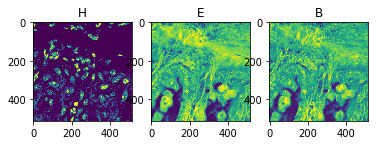

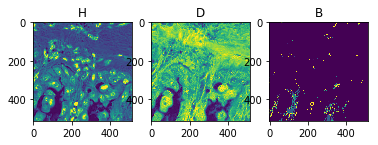

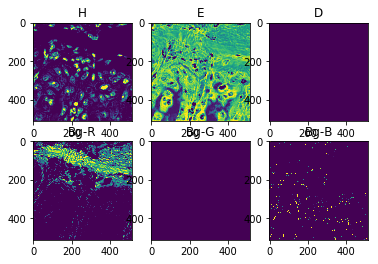

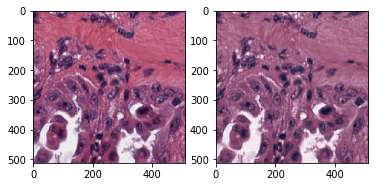

Saved model to ./models/deconv-GAN-512-40X-9/0_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 0 / 600 	 Time Taken: 105 sec
Train epoch 1
loss_G 1.383	loss_gan 0.519	loss_rec 0.864	image_loss 0.472	perceptual_loss 0.088	bg_penalty 0.084	stain_penalty 0.0	h_sparsity 0.126	e_penalty 0.222	cov_penalty -0.128	loss_D 0.257	
loss_G 1.375	loss_gan 0.528	loss_rec 0.847	image_loss 0.464	perceptual_loss 0.086	bg_penalty 0.073	stain_penalty 0.0	h_sparsity 0.126	e_penalty 0.228	cov_penalty -0.129	loss_D 0.261	
loss_G 1.375	loss_gan 0.528	loss_rec 0.847	image_loss 0.462	perceptual_loss 0.086	bg_penalty 0.072	stain_penalty 0.0	h_sparsity 0.126	e_penalty 0.229	cov_penalty -0.128	loss_D 0.251	
Val epoch 1
loss_G 0.856	loss_gan 0.279	loss_rec 0.577	image_loss 0.293	perceptual_loss 0.082	bg_penalty 0.019	stain_penalty 0.0	h_sparsity 0.048	e_penalty 0.157	cov_penalty -0.023	loss_D 0.308	
learning rate 0.0001000 -> 0.0001000
End of epoch 1 / 600 	 Time Taken: 103 sec
Train epoch 2
loss_G 1.382	

Val epoch 10
loss_G 0.953	loss_gan 0.411	loss_rec 0.542	image_loss 0.246	perceptual_loss 0.068	bg_penalty 0.013	stain_penalty 0.0	h_sparsity 0.044	e_penalty 0.179	cov_penalty -0.007	loss_D 0.205	
Saved model to ./models/deconv-GAN-512-40X-9/10_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 10 / 600 	 Time Taken: 105 sec
Train epoch 11
loss_G 1.428	loss_gan 0.65	loss_rec 0.779	image_loss 0.434	perceptual_loss 0.077	bg_penalty 0.046	stain_penalty 0.0	h_sparsity 0.13	e_penalty 0.224	cov_penalty -0.133	loss_D 0.19	
loss_G 1.398	loss_gan 0.614	loss_rec 0.784	image_loss 0.439	perceptual_loss 0.077	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.128	e_penalty 0.221	cov_penalty -0.125	loss_D 0.185	
loss_G 1.39	loss_gan 0.62	loss_rec 0.77	image_loss 0.426	perceptual_loss 0.076	bg_penalty 0.043	stain_penalty 0.0	h_sparsity 0.128	e_penalty 0.222	cov_penalty -0.125	loss_D 0.181	
Val epoch 11
loss_G 0.795	loss_gan 0.278	loss_rec 0.518	image_loss 0.202	perceptual_loss 0.069	bg_penalty 0.0

loss_G 1.389	loss_gan 0.613	loss_rec 0.776	image_loss 0.428	perceptual_loss 0.077	bg_penalty 0.038	stain_penalty 0.0	h_sparsity 0.13	e_penalty 0.233	cov_penalty -0.13	loss_D 0.17	
Val epoch 20
loss_G 0.687	loss_gan 0.172	loss_rec 0.514	image_loss 0.207	perceptual_loss 0.073	bg_penalty 0.011	stain_penalty 0.0	h_sparsity 0.042	e_penalty 0.19	cov_penalty -0.008	loss_D 0.226	
tensor([[0.6341, 0.6610, 0.4011],
        [0.4182, 0.7578, 0.5007],
        [0.7527, 0.3406, 0.5634],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[0.6174, 0.0251],
        [0.6921, 0.0208],
        [0.6525, 0.0225]], device='cuda:0')


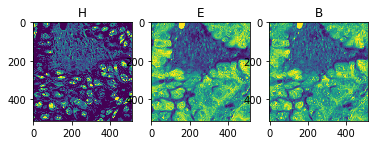

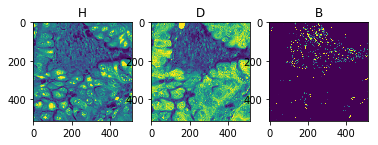

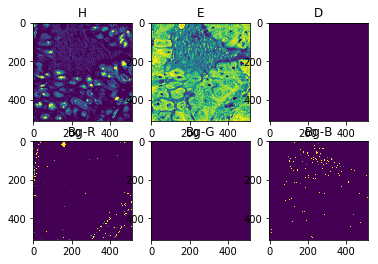

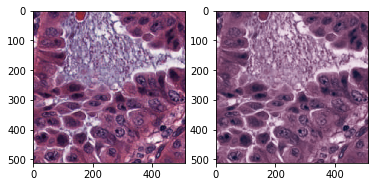

Saved model to ./models/deconv-GAN-512-40X-9/20_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 20 / 600 	 Time Taken: 105 sec
Train epoch 21
loss_G 1.366	loss_gan 0.608	loss_rec 0.757	image_loss 0.418	perceptual_loss 0.075	bg_penalty 0.037	stain_penalty 0.0	h_sparsity 0.129	e_penalty 0.222	cov_penalty -0.124	loss_D 0.168	
loss_G 1.312	loss_gan 0.601	loss_rec 0.711	image_loss 0.383	perceptual_loss 0.072	bg_penalty 0.03	stain_penalty 0.0	h_sparsity 0.126	e_penalty 0.214	cov_penalty -0.115	loss_D 0.171	
loss_G 1.296	loss_gan 0.578	loss_rec 0.718	image_loss 0.385	perceptual_loss 0.074	bg_penalty 0.03	stain_penalty 0.0	h_sparsity 0.127	e_penalty 0.216	cov_penalty -0.113	loss_D 0.174	
Val epoch 21
loss_G 0.975	loss_gan 0.449	loss_rec 0.526	image_loss 0.249	perceptual_loss 0.061	bg_penalty 0.008	stain_penalty 0.0	h_sparsity 0.05	e_penalty 0.167	cov_penalty -0.009	loss_D 0.178	
learning rate 0.0001000 -> 0.0001000
End of epoch 21 / 600 	 Time Taken: 104 sec
Train epoch 22
loss_G 1.4

Val epoch 30
loss_G 0.961	loss_gan 0.409	loss_rec 0.553	image_loss 0.246	perceptual_loss 0.075	bg_penalty 0.016	stain_penalty 0.0	h_sparsity 0.044	e_penalty 0.186	cov_penalty -0.014	loss_D 0.141	
Saved model to ./models/deconv-GAN-512-40X-9/30_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 30 / 600 	 Time Taken: 105 sec
Train epoch 31
loss_G 1.426	loss_gan 0.669	loss_rec 0.758	image_loss 0.402	perceptual_loss 0.075	bg_penalty 0.039	stain_penalty 0.0	h_sparsity 0.132	e_penalty 0.228	cov_penalty -0.119	loss_D 0.166	
loss_G 1.398	loss_gan 0.663	loss_rec 0.735	image_loss 0.384	perceptual_loss 0.076	bg_penalty 0.038	stain_penalty 0.0	h_sparsity 0.131	e_penalty 0.228	cov_penalty -0.123	loss_D 0.16	
loss_G 1.366	loss_gan 0.642	loss_rec 0.724	image_loss 0.375	perceptual_loss 0.076	bg_penalty 0.037	stain_penalty 0.0	h_sparsity 0.131	e_penalty 0.23	cov_penalty -0.123	loss_D 0.163	
Val epoch 31
loss_G 0.723	loss_gan 0.143	loss_rec 0.58	image_loss 0.248	perceptual_loss 0.079	bg_penalty 

loss_G 1.403	loss_gan 0.628	loss_rec 0.775	image_loss 0.412	perceptual_loss 0.077	bg_penalty 0.05	stain_penalty 0.0	h_sparsity 0.132	e_penalty 0.229	cov_penalty -0.126	loss_D 0.167	
Val epoch 40
loss_G 0.792	loss_gan 0.28	loss_rec 0.512	image_loss 0.213	perceptual_loss 0.081	bg_penalty 0.015	stain_penalty 0.0	h_sparsity 0.048	e_penalty 0.169	cov_penalty -0.014	loss_D 0.195	
tensor([[0.6068, 0.6663, 0.4334],
        [0.3688, 0.7586, 0.5371],
        [0.8782, 0.2070, 0.4312],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[0.6121, 0.0369],
        [0.4466, 0.0094],
        [0.4794, 0.0200]], device='cuda:0')


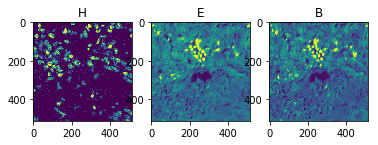

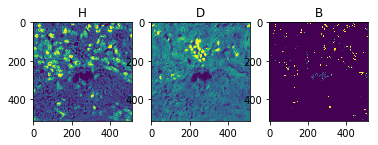

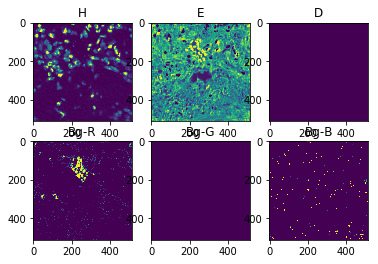

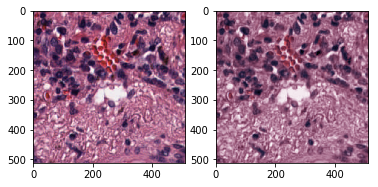

Saved model to ./models/deconv-GAN-512-40X-9/40_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 40 / 600 	 Time Taken: 105 sec
Train epoch 41
loss_G 1.517	loss_gan 0.626	loss_rec 0.891	image_loss 0.525	perceptual_loss 0.078	bg_penalty 0.048	stain_penalty 0.0	h_sparsity 0.131	e_penalty 0.228	cov_penalty -0.121	loss_D 0.172	
loss_G 1.462	loss_gan 0.634	loss_rec 0.828	image_loss 0.462	perceptual_loss 0.081	bg_penalty 0.048	stain_penalty 0.0	h_sparsity 0.132	e_penalty 0.227	cov_penalty -0.121	loss_D 0.15	
loss_G 1.422	loss_gan 0.63	loss_rec 0.792	image_loss 0.428	perceptual_loss 0.08	bg_penalty 0.046	stain_penalty 0.0	h_sparsity 0.13	e_penalty 0.227	cov_penalty -0.119	loss_D 0.148	
Val epoch 41
loss_G 0.747	loss_gan 0.277	loss_rec 0.47	image_loss 0.178	perceptual_loss 0.08	bg_penalty 0.011	stain_penalty 0.0	h_sparsity 0.052	e_penalty 0.162	cov_penalty -0.013	loss_D 0.162	
learning rate 0.0001000 -> 0.0001000
End of epoch 41 / 600 	 Time Taken: 103 sec
Train epoch 42
loss_G 1.331	

Val epoch 50
loss_G 1.374	loss_gan 1.022	loss_rec 0.352	image_loss 0.111	perceptual_loss 0.052	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.068	e_penalty 0.113	cov_penalty 0.006	loss_D 0.019	
Saved model to ./models/deconv-GAN-512-40X-9/50_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 50 / 600 	 Time Taken: 103 sec
Train epoch 51
loss_G 1.507	loss_gan 0.98	loss_rec 0.528	image_loss 0.258	perceptual_loss 0.053	bg_penalty 0.007	stain_penalty 0.0	h_sparsity 0.136	e_penalty 0.133	cov_penalty -0.059	loss_D 0.024	
loss_G 1.538	loss_gan 0.976	loss_rec 0.562	image_loss 0.277	perceptual_loss 0.054	bg_penalty 0.008	stain_penalty 0.0	h_sparsity 0.14	e_penalty 0.145	cov_penalty -0.061	loss_D 0.026	
loss_G 1.561	loss_gan 0.972	loss_rec 0.59	image_loss 0.297	perceptual_loss 0.055	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.142	e_penalty 0.152	cov_penalty -0.066	loss_D 0.024	
Val epoch 51
loss_G 1.337	loss_gan 0.953	loss_rec 0.384	image_loss 0.134	perceptual_loss 0.053	bg_penalty 0.

loss_G 1.59	loss_gan 0.993	loss_rec 0.598	image_loss 0.31	perceptual_loss 0.051	bg_penalty 0.011	stain_penalty 0.0	h_sparsity 0.145	e_penalty 0.157	cov_penalty -0.077	loss_D 0.026	
Val epoch 60
loss_G 1.434	loss_gan 1.058	loss_rec 0.376	image_loss 0.143	perceptual_loss 0.052	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.064	e_penalty 0.113	cov_penalty 0.002	loss_D 0.019	
tensor([[0.6976, 0.6137, 0.3697],
        [0.4905, 0.7236, 0.4856],
        [0.8248, 0.2167, 0.5223],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[-0.2492,  0.5929],
        [-0.2532,  0.5765],
        [-0.2356,  0.5894]], device='cuda:0')


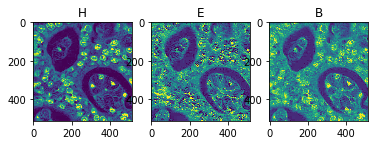

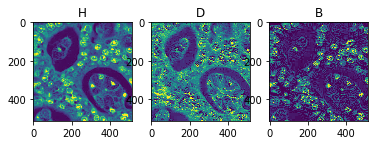

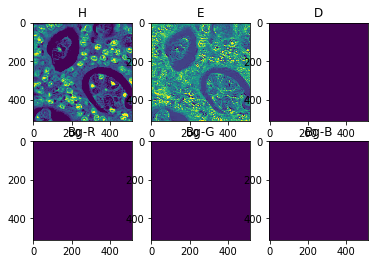

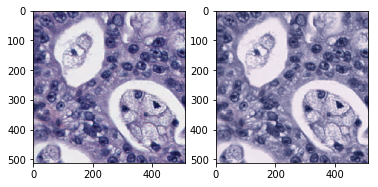

Saved model to ./models/deconv-GAN-512-40X-9/60_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 60 / 600 	 Time Taken: 106 sec
Train epoch 61
loss_G 1.64	loss_gan 0.996	loss_rec 0.645	image_loss 0.353	perceptual_loss 0.055	bg_penalty 0.014	stain_penalty 0.0	h_sparsity 0.148	e_penalty 0.154	cov_penalty -0.08	loss_D 0.013	
loss_G 1.577	loss_gan 0.985	loss_rec 0.592	image_loss 0.305	perceptual_loss 0.053	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.146	e_penalty 0.153	cov_penalty -0.077	loss_D 0.015	
loss_G 1.564	loss_gan 0.985	loss_rec 0.579	image_loss 0.295	perceptual_loss 0.053	bg_penalty 0.011	stain_penalty 0.0	h_sparsity 0.146	e_penalty 0.151	cov_penalty -0.077	loss_D 0.013	
Val epoch 61
loss_G 1.373	loss_gan 0.982	loss_rec 0.391	image_loss 0.162	perceptual_loss 0.048	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.063	e_penalty 0.114	cov_penalty 0.002	loss_D 0.007	
learning rate 0.0001000 -> 0.0001000
End of epoch 61 / 600 	 Time Taken: 105 sec
Train epoch 62
loss_G 1.5

Val epoch 70
loss_G 1.115	loss_gan 0.757	loss_rec 0.357	image_loss 0.12	perceptual_loss 0.043	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.064	e_penalty 0.123	cov_penalty 0.005	loss_D 0.028	
Saved model to ./models/deconv-GAN-512-40X-9/70_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 70 / 600 	 Time Taken: 104 sec
Train epoch 71
loss_G 1.528	loss_gan 0.983	loss_rec 0.546	image_loss 0.28	perceptual_loss 0.048	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.151	e_penalty 0.144	cov_penalty -0.087	loss_D 0.021	
loss_G 1.506	loss_gan 0.982	loss_rec 0.524	image_loss 0.269	perceptual_loss 0.048	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.147	e_penalty 0.133	cov_penalty -0.082	loss_D 0.023	
loss_G 1.511	loss_gan 0.982	loss_rec 0.529	image_loss 0.271	perceptual_loss 0.049	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.148	e_penalty 0.136	cov_penalty -0.084	loss_D 0.019	
Val epoch 71
loss_G 1.323	loss_gan 1.008	loss_rec 0.315	image_loss 0.101	perceptual_loss 0.042	bg_penalty 0

loss_G 1.539	loss_gan 0.995	loss_rec 0.544	image_loss 0.293	perceptual_loss 0.049	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.151	e_penalty 0.131	cov_penalty -0.091	loss_D 0.009	
Val epoch 80
loss_G 1.546	loss_gan 1.107	loss_rec 0.439	image_loss 0.209	perceptual_loss 0.058	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.061	e_penalty 0.108	cov_penalty 0.001	loss_D 0.04	
tensor([[0.6529, 0.6421, 0.4019],
        [0.3722, 0.7490, 0.5481],
        [0.8846, 0.1773, 0.4313],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[-0.2875,  0.7349],
        [-0.2773,  0.6507],
        [-0.2925,  0.7412]], device='cuda:0')


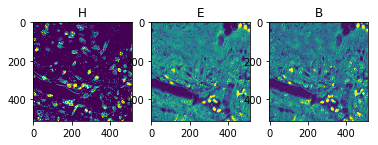

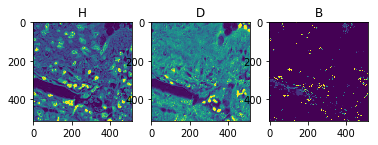

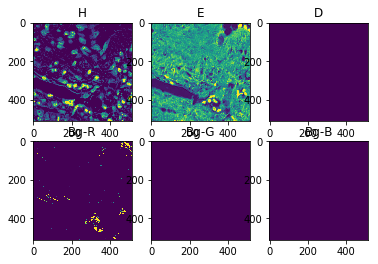

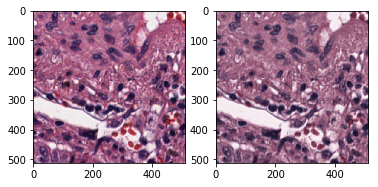

Saved model to ./models/deconv-GAN-512-40X-9/80_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 80 / 600 	 Time Taken: 106 sec
Train epoch 81
loss_G 1.535	loss_gan 1.004	loss_rec 0.531	image_loss 0.278	perceptual_loss 0.049	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.151	e_penalty 0.13	cov_penalty -0.088	loss_D 0.02	
loss_G 1.523	loss_gan 1.002	loss_rec 0.521	image_loss 0.276	perceptual_loss 0.049	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.15	e_penalty 0.124	cov_penalty -0.087	loss_D 0.017	
loss_G 1.521	loss_gan 1.0	loss_rec 0.521	image_loss 0.278	perceptual_loss 0.049	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.15	e_penalty 0.121	cov_penalty -0.086	loss_D 0.014	
Val epoch 81
loss_G 1.384	loss_gan 1.034	loss_rec 0.35	image_loss 0.12	perceptual_loss 0.047	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.065	e_penalty 0.117	cov_penalty -0.0	loss_D 0.003	
learning rate 0.0001000 -> 0.0001000
End of epoch 81 / 600 	 Time Taken: 102 sec
Train epoch 82
loss_G 1.464	loss_g

Val epoch 90
loss_G 1.378	loss_gan 0.984	loss_rec 0.394	image_loss 0.148	perceptual_loss 0.048	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.059	e_penalty 0.133	cov_penalty 0.004	loss_D 0.005	
Saved model to ./models/deconv-GAN-512-40X-9/90_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 90 / 600 	 Time Taken: 104 sec
Train epoch 91
loss_G 1.588	loss_gan 0.976	loss_rec 0.612	image_loss 0.349	perceptual_loss 0.05	bg_penalty 0.016	stain_penalty 0.0	h_sparsity 0.155	e_penalty 0.136	cov_penalty -0.094	loss_D 0.017	
loss_G 1.507	loss_gan 0.993	loss_rec 0.514	image_loss 0.274	perceptual_loss 0.046	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.152	e_penalty 0.122	cov_penalty -0.091	loss_D 0.014	
loss_G 1.511	loss_gan 0.988	loss_rec 0.523	image_loss 0.28	perceptual_loss 0.047	bg_penalty 0.011	stain_penalty 0.0	h_sparsity 0.154	e_penalty 0.123	cov_penalty -0.092	loss_D 0.012	
Val epoch 91
loss_G 1.359	loss_gan 0.993	loss_rec 0.366	image_loss 0.144	perceptual_loss 0.048	bg_penalty 

loss_G 1.475	loss_gan 0.989	loss_rec 0.486	image_loss 0.252	perceptual_loss 0.045	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.155	e_penalty 0.12	cov_penalty -0.095	loss_D 0.017	
Val epoch 100
loss_G 1.373	loss_gan 1.009	loss_rec 0.364	image_loss 0.124	perceptual_loss 0.051	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.069	e_penalty 0.114	cov_penalty 0.003	loss_D 0.004	
tensor([[0.6800, 0.6183, 0.3940],
        [0.4221, 0.7496, 0.5098],
        [0.8466, 0.1864, 0.4986],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[-0.3025,  0.6387],
        [-0.2973,  0.6705],
        [-0.2910,  0.6064]], device='cuda:0')


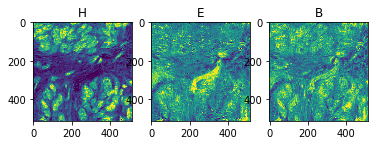

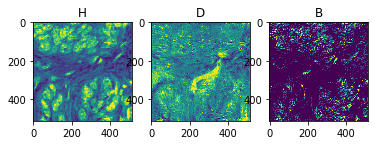

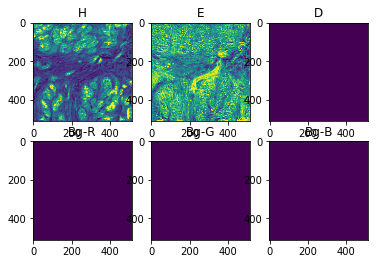

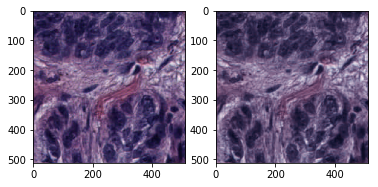

Saved model to ./models/deconv-GAN-512-40X-9/100_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 100 / 600 	 Time Taken: 107 sec
Train epoch 101
loss_G 1.477	loss_gan 0.995	loss_rec 0.482	image_loss 0.241	perceptual_loss 0.044	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.151	e_penalty 0.129	cov_penalty -0.093	loss_D 0.008	
loss_G 1.501	loss_gan 0.988	loss_rec 0.513	image_loss 0.269	perceptual_loss 0.045	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.154	e_penalty 0.132	cov_penalty -0.098	loss_D 0.014	
loss_G 1.505	loss_gan 0.992	loss_rec 0.513	image_loss 0.271	perceptual_loss 0.046	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.156	e_penalty 0.128	cov_penalty -0.097	loss_D 0.012	
Val epoch 101
loss_G 1.47	loss_gan 1.106	loss_rec 0.363	image_loss 0.153	perceptual_loss 0.048	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.07	e_penalty 0.093	cov_penalty -0.001	loss_D 0.006	
learning rate 0.0001000 -> 0.0001000
End of epoch 101 / 600 	 Time Taken: 104 sec
Train epoch 102
loss_G

Val epoch 110
loss_G 1.465	loss_gan 1.129	loss_rec 0.336	image_loss 0.115	perceptual_loss 0.044	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.067	e_penalty 0.111	cov_penalty -0.002	loss_D 0.018	
Saved model to ./models/deconv-GAN-512-40X-9/110_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 110 / 600 	 Time Taken: 105 sec
Train epoch 111
loss_G 1.488	loss_gan 0.993	loss_rec 0.495	image_loss 0.264	perceptual_loss 0.042	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.157	e_penalty 0.125	cov_penalty -0.104	loss_D 0.008	
loss_G 1.514	loss_gan 0.996	loss_rec 0.518	image_loss 0.283	perceptual_loss 0.045	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.158	e_penalty 0.122	cov_penalty -0.099	loss_D 0.006	
loss_G 1.512	loss_gan 1.0	loss_rec 0.512	image_loss 0.277	perceptual_loss 0.045	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.158	e_penalty 0.125	cov_penalty -0.104	loss_D 0.009	
Val epoch 111
loss_G 1.396	loss_gan 1.001	loss_rec 0.395	image_loss 0.184	perceptual_loss 0.05	bg_penal

loss_G 1.467	loss_gan 0.996	loss_rec 0.471	image_loss 0.247	perceptual_loss 0.044	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.158	e_penalty 0.108	cov_penalty -0.095	loss_D 0.003	
Val epoch 120
loss_G 1.419	loss_gan 1.066	loss_rec 0.353	image_loss 0.133	perceptual_loss 0.055	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.073	e_penalty 0.096	cov_penalty -0.004	loss_D 0.003	
tensor([[0.6658, 0.6389, 0.3853],
        [0.4185, 0.7480, 0.5151],
        [0.8146, 0.1903, 0.5478],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[-0.3016,  0.9749],
        [-0.2960,  0.9214],
        [-0.2721,  0.6907]], device='cuda:0')


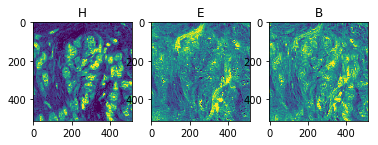

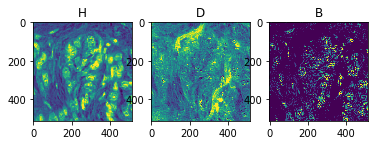

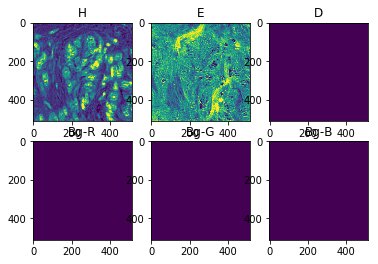

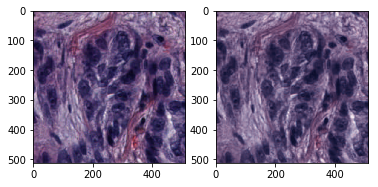

Saved model to ./models/deconv-GAN-512-40X-9/120_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 120 / 600 	 Time Taken: 105 sec
Train epoch 121
loss_G 1.442	loss_gan 0.995	loss_rec 0.447	image_loss 0.231	perceptual_loss 0.041	bg_penalty 0.008	stain_penalty 0.0	h_sparsity 0.159	e_penalty 0.11	cov_penalty -0.102	loss_D 0.005	
loss_G 1.429	loss_gan 0.995	loss_rec 0.434	image_loss 0.221	perceptual_loss 0.042	bg_penalty 0.007	stain_penalty 0.0	h_sparsity 0.159	e_penalty 0.105	cov_penalty -0.101	loss_D 0.005	
loss_G 1.446	loss_gan 0.997	loss_rec 0.449	image_loss 0.23	perceptual_loss 0.043	bg_penalty 0.008	stain_penalty 0.0	h_sparsity 0.158	e_penalty 0.104	cov_penalty -0.094	loss_D 0.004	
Val epoch 121
loss_G 1.297	loss_gan 0.975	loss_rec 0.323	image_loss 0.124	perceptual_loss 0.047	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.074	e_penalty 0.082	cov_penalty -0.004	loss_D 0.004	
learning rate 0.0001000 -> 0.0001000
End of epoch 121 / 600 	 Time Taken: 104 sec
Train epoch 122
los

Val epoch 130
loss_G 1.237	loss_gan 0.963	loss_rec 0.274	image_loss 0.086	perceptual_loss 0.041	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.084	e_penalty 0.075	cov_penalty -0.012	loss_D 0.005	
Saved model to ./models/deconv-GAN-512-40X-9/130_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 130 / 600 	 Time Taken: 104 sec
Train epoch 131
loss_G 1.413	loss_gan 0.995	loss_rec 0.418	image_loss 0.205	perceptual_loss 0.04	bg_penalty 0.008	stain_penalty 0.0	h_sparsity 0.158	e_penalty 0.108	cov_penalty -0.101	loss_D 0.006	
loss_G 1.466	loss_gan 1.006	loss_rec 0.46	image_loss 0.239	perceptual_loss 0.043	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.112	cov_penalty -0.106	loss_D 0.018	
loss_G 1.468	loss_gan 1.002	loss_rec 0.466	image_loss 0.246	perceptual_loss 0.042	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.161	e_penalty 0.109	cov_penalty -0.103	loss_D 0.013	
Val epoch 131
loss_G 1.351	loss_gan 0.976	loss_rec 0.375	image_loss 0.172	perceptual_loss 0.043	bg_pena

loss_G 1.44	loss_gan 1.002	loss_rec 0.438	image_loss 0.224	perceptual_loss 0.042	bg_penalty 0.008	stain_penalty 0.0	h_sparsity 0.163	e_penalty 0.104	cov_penalty -0.102	loss_D 0.008	
Val epoch 140
loss_G 1.386	loss_gan 1.03	loss_rec 0.356	image_loss 0.156	perceptual_loss 0.043	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.071	e_penalty 0.091	cov_penalty -0.006	loss_D 0.002	
tensor([[0.6658, 0.6395, 0.3844],
        [0.3903, 0.7649, 0.5124],
        [0.8579, 0.1809, 0.4808],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[-0.3052,  0.6439],
        [-0.2984,  0.7067],
        [-0.3059,  0.8556]], device='cuda:0')


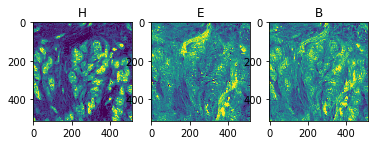

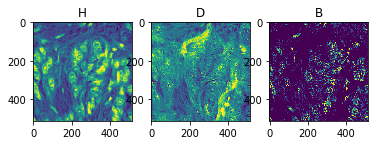

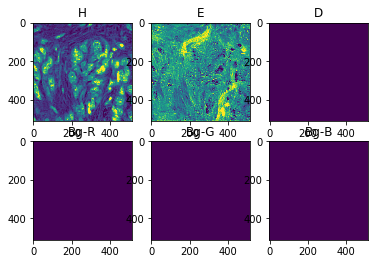

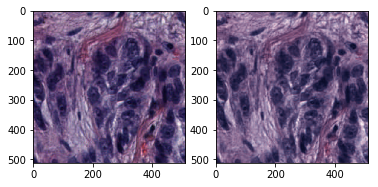

Saved model to ./models/deconv-GAN-512-40X-9/140_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 140 / 600 	 Time Taken: 105 sec
Train epoch 141
loss_G 1.456	loss_gan 1.006	loss_rec 0.45	image_loss 0.236	perceptual_loss 0.042	bg_penalty 0.007	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.1	cov_penalty -0.097	loss_D 0.017	
loss_G 1.441	loss_gan 1.004	loss_rec 0.437	image_loss 0.223	perceptual_loss 0.04	bg_penalty 0.007	stain_penalty 0.0	h_sparsity 0.165	e_penalty 0.106	cov_penalty -0.105	loss_D 0.012	
loss_G 1.445	loss_gan 1.002	loss_rec 0.443	image_loss 0.228	perceptual_loss 0.042	bg_penalty 0.008	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.105	cov_penalty -0.103	loss_D 0.01	
Val epoch 141
loss_G 1.353	loss_gan 1.019	loss_rec 0.334	image_loss 0.131	perceptual_loss 0.041	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.068	e_penalty 0.102	cov_penalty -0.008	loss_D 0.002	
learning rate 0.0001000 -> 0.0001000
End of epoch 141 / 600 	 Time Taken: 104 sec
Train epoch 142
loss_G

Val epoch 150
loss_G 1.318	loss_gan 1.024	loss_rec 0.294	image_loss 0.097	perceptual_loss 0.039	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.074	e_penalty 0.094	cov_penalty -0.01	loss_D 0.002	
Saved model to ./models/deconv-GAN-512-40X-9/150_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 150 / 600 	 Time Taken: 104 sec
Train epoch 151
loss_G 1.53	loss_gan 1.001	loss_rec 0.529	image_loss 0.305	perceptual_loss 0.043	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.17	e_penalty 0.11	cov_penalty -0.111	loss_D 0.003	
loss_G 1.489	loss_gan 1.0	loss_rec 0.489	image_loss 0.269	perceptual_loss 0.042	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.167	e_penalty 0.107	cov_penalty -0.106	loss_D 0.002	
loss_G 1.466	loss_gan 1.0	loss_rec 0.466	image_loss 0.251	perceptual_loss 0.042	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.166	e_penalty 0.107	cov_penalty -0.11	loss_D 0.002	
Val epoch 151
loss_G 1.281	loss_gan 0.998	loss_rec 0.284	image_loss 0.091	perceptual_loss 0.034	bg_penalty 0.

loss_G 1.436	loss_gan 1.006	loss_rec 0.43	image_loss 0.221	perceptual_loss 0.041	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.165	e_penalty 0.1	cov_penalty -0.106	loss_D 0.013	
Val epoch 160
loss_G 1.354	loss_gan 1.013	loss_rec 0.342	image_loss 0.15	perceptual_loss 0.044	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.072	e_penalty 0.082	cov_penalty -0.008	loss_D 0.005	
tensor([[0.6220, 0.6557, 0.4281],
        [0.3480, 0.7766, 0.5251],
        [0.8378, 0.1813, 0.5150],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[-0.3036,  0.7943],
        [-0.3008,  0.8789],
        [-0.3022,  0.7511]], device='cuda:0')


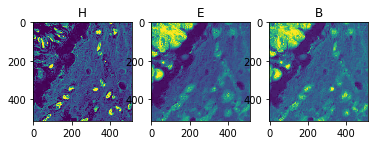

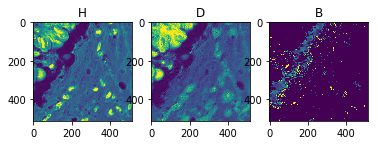

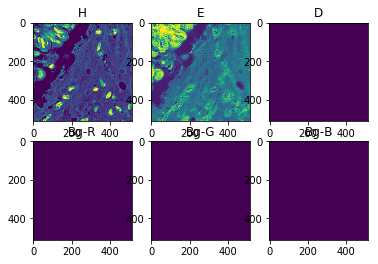

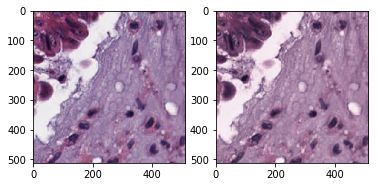

Saved model to ./models/deconv-GAN-512-40X-9/160_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 160 / 600 	 Time Taken: 105 sec
Train epoch 161
loss_G 1.405	loss_gan 0.979	loss_rec 0.427	image_loss 0.219	perceptual_loss 0.04	bg_penalty 0.008	stain_penalty 0.0	h_sparsity 0.17	e_penalty 0.102	cov_penalty -0.113	loss_D 0.01	
loss_G 1.411	loss_gan 0.99	loss_rec 0.421	image_loss 0.214	perceptual_loss 0.042	bg_penalty 0.007	stain_penalty 0.0	h_sparsity 0.166	e_penalty 0.094	cov_penalty -0.101	loss_D 0.007	
loss_G 1.409	loss_gan 0.99	loss_rec 0.418	image_loss 0.211	perceptual_loss 0.042	bg_penalty 0.007	stain_penalty 0.0	h_sparsity 0.166	e_penalty 0.094	cov_penalty -0.101	loss_D 0.006	
Val epoch 161
loss_G 1.379	loss_gan 1.042	loss_rec 0.337	image_loss 0.145	perceptual_loss 0.049	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.079	e_penalty 0.075	cov_penalty -0.011	loss_D 0.003	
learning rate 0.0001000 -> 0.0001000
End of epoch 161 / 600 	 Time Taken: 103 sec
Train epoch 162
loss_G

Val epoch 170
loss_G 1.156	loss_gan 0.881	loss_rec 0.275	image_loss 0.094	perceptual_loss 0.036	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.086	e_penalty 0.064	cov_penalty -0.007	loss_D 0.009	
Saved model to ./models/deconv-GAN-512-40X-9/170_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 170 / 600 	 Time Taken: 103 sec
Train epoch 171
loss_G 1.488	loss_gan 1.001	loss_rec 0.487	image_loss 0.267	perceptual_loss 0.042	bg_penalty 0.011	stain_penalty 0.0	h_sparsity 0.175	e_penalty 0.108	cov_penalty -0.115	loss_D 0.004	
loss_G 1.475	loss_gan 0.997	loss_rec 0.478	image_loss 0.259	perceptual_loss 0.042	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.174	e_penalty 0.105	cov_penalty -0.111	loss_D 0.004	
loss_G 1.454	loss_gan 0.997	loss_rec 0.456	image_loss 0.242	perceptual_loss 0.042	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.171	e_penalty 0.101	cov_penalty -0.109	loss_D 0.003	
Val epoch 171
loss_G 1.228	loss_gan 0.969	loss_rec 0.26	image_loss 0.087	perceptual_loss 0.035	bg_pe

loss_G 1.439	loss_gan 0.995	loss_rec 0.444	image_loss 0.233	perceptual_loss 0.042	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.172	e_penalty 0.105	cov_penalty -0.118	loss_D 0.003	
Val epoch 180
loss_G 1.243	loss_gan 0.942	loss_rec 0.301	image_loss 0.108	perceptual_loss 0.042	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.077	e_penalty 0.085	cov_penalty -0.012	loss_D 0.004	
tensor([[0.6359, 0.6584, 0.4026],
        [0.3336, 0.7672, 0.5478],
        [0.8648, 0.1741, 0.4711],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[-0.3088,  1.0621],
        [-0.3086,  1.0176],
        [-0.3052,  0.7749]], device='cuda:0')


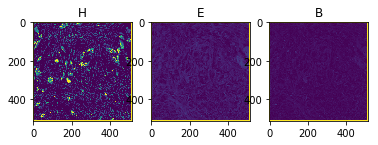

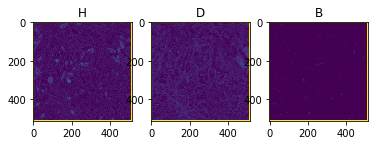

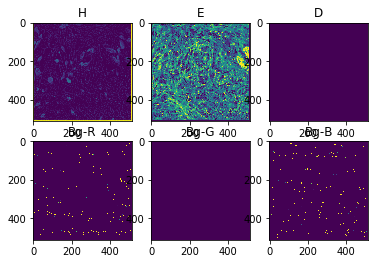

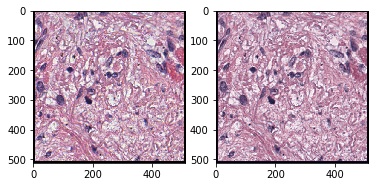

Saved model to ./models/deconv-GAN-512-40X-9/180_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 180 / 600 	 Time Taken: 106 sec
Train epoch 181
loss_G 1.4	loss_gan 0.997	loss_rec 0.403	image_loss 0.197	perceptual_loss 0.039	bg_penalty 0.008	stain_penalty 0.0	h_sparsity 0.169	e_penalty 0.099	cov_penalty -0.109	loss_D 0.004	
loss_G 1.413	loss_gan 0.996	loss_rec 0.417	image_loss 0.211	perceptual_loss 0.04	bg_penalty 0.008	stain_penalty 0.0	h_sparsity 0.169	e_penalty 0.099	cov_penalty -0.11	loss_D 0.005	
loss_G 1.4	loss_gan 0.994	loss_rec 0.407	image_loss 0.2	perceptual_loss 0.04	bg_penalty 0.007	stain_penalty 0.0	h_sparsity 0.169	e_penalty 0.098	cov_penalty -0.108	loss_D 0.005	
Val epoch 181
loss_G 1.287	loss_gan 1.003	loss_rec 0.284	image_loss 0.086	perceptual_loss 0.035	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.072	e_penalty 0.099	cov_penalty -0.01	loss_D 0.001	
learning rate 0.0001000 -> 0.0001000
End of epoch 181 / 600 	 Time Taken: 104 sec
Train epoch 182
loss_G 1.4	

Val epoch 190
loss_G 1.202	loss_gan 0.934	loss_rec 0.268	image_loss 0.087	perceptual_loss 0.033	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.082	e_penalty 0.074	cov_penalty -0.009	loss_D 0.016	
Saved model to ./models/deconv-GAN-512-40X-9/190_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 190 / 600 	 Time Taken: 104 sec
Train epoch 191
loss_G 1.398	loss_gan 0.993	loss_rec 0.405	image_loss 0.2	perceptual_loss 0.04	bg_penalty 0.007	stain_penalty 0.0	h_sparsity 0.17	e_penalty 0.101	cov_penalty -0.113	loss_D 0.004	
loss_G 1.384	loss_gan 0.994	loss_rec 0.39	image_loss 0.189	perceptual_loss 0.039	bg_penalty 0.006	stain_penalty 0.0	h_sparsity 0.169	e_penalty 0.097	cov_penalty -0.11	loss_D 0.003	
loss_G 1.384	loss_gan 0.997	loss_rec 0.387	image_loss 0.188	perceptual_loss 0.039	bg_penalty 0.006	stain_penalty 0.0	h_sparsity 0.168	e_penalty 0.093	cov_penalty -0.107	loss_D 0.003	
Val epoch 191
loss_G 1.313	loss_gan 0.998	loss_rec 0.316	image_loss 0.136	perceptual_loss 0.04	bg_penalty

loss_G 1.432	loss_gan 1.009	loss_rec 0.422	image_loss 0.215	perceptual_loss 0.041	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.175	e_penalty 0.101	cov_penalty -0.12	loss_D 0.012	
Val epoch 200
loss_G 1.969	loss_gan 1.611	loss_rec 0.358	image_loss 0.16	perceptual_loss 0.046	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.073	e_penalty 0.088	cov_penalty -0.011	loss_D 0.515	
tensor([[0.7127, 0.5948, 0.3719],
        [0.4662, 0.6858, 0.5589],
        [0.8218, 0.2039, 0.5320],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[-0.3014,  1.0573],
        [-0.2930,  1.1212],
        [-0.2991,  1.0261]], device='cuda:0')


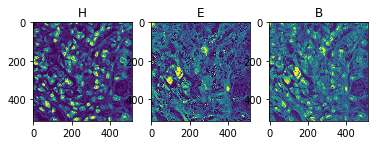

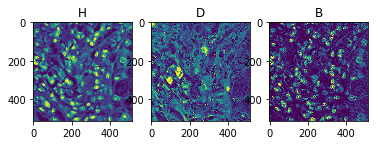

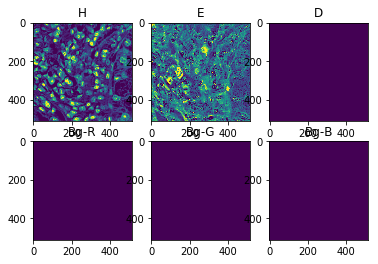

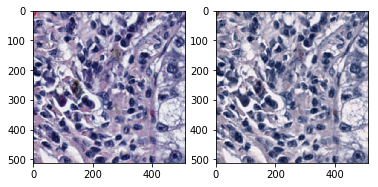

Saved model to ./models/deconv-GAN-512-40X-9/200_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 200 / 600 	 Time Taken: 105 sec
Train epoch 201
loss_G 1.403	loss_gan 1.007	loss_rec 0.395	image_loss 0.194	perceptual_loss 0.039	bg_penalty 0.008	stain_penalty 0.0	h_sparsity 0.174	e_penalty 0.099	cov_penalty -0.118	loss_D 0.047	
loss_G 1.385	loss_gan 0.972	loss_rec 0.413	image_loss 0.205	perceptual_loss 0.039	bg_penalty 0.008	stain_penalty 0.0	h_sparsity 0.176	e_penalty 0.104	cov_penalty -0.12	loss_D 0.034	
loss_G 1.38	loss_gan 0.979	loss_rec 0.401	image_loss 0.197	perceptual_loss 0.039	bg_penalty 0.007	stain_penalty 0.0	h_sparsity 0.174	e_penalty 0.098	cov_penalty -0.114	loss_D 0.024	
Val epoch 201
loss_G 1.141	loss_gan 0.863	loss_rec 0.277	image_loss 0.099	perceptual_loss 0.034	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.079	e_penalty 0.075	cov_penalty -0.011	loss_D 0.006	
learning rate 0.0001000 -> 0.0001000
End of epoch 201 / 600 	 Time Taken: 104 sec
Train epoch 202
los

Val epoch 210
loss_G 0.735	loss_gan 0.341	loss_rec 0.394	image_loss 0.162	perceptual_loss 0.044	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.056	e_penalty 0.135	cov_penalty -0.005	loss_D 0.135	
Saved model to ./models/deconv-GAN-512-40X-9/210_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 210 / 600 	 Time Taken: 104 sec
Train epoch 211
loss_G 1.283	loss_gan 0.817	loss_rec 0.465	image_loss 0.257	perceptual_loss 0.05	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.169	e_penalty 0.112	cov_penalty -0.131	loss_D 0.097	
loss_G 1.246	loss_gan 0.795	loss_rec 0.451	image_loss 0.243	perceptual_loss 0.049	bg_penalty 0.008	stain_penalty 0.0	h_sparsity 0.167	e_penalty 0.113	cov_penalty -0.129	loss_D 0.096	
loss_G 1.272	loss_gan 0.821	loss_rec 0.451	image_loss 0.241	perceptual_loss 0.049	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.167	e_penalty 0.114	cov_penalty -0.13	loss_D 0.086	
Val epoch 211
loss_G 1.056	loss_gan 0.643	loss_rec 0.413	image_loss 0.186	perceptual_loss 0.055	bg_pe

loss_G 1.254	loss_gan 0.805	loss_rec 0.449	image_loss 0.232	perceptual_loss 0.053	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.169	e_penalty 0.122	cov_penalty -0.136	loss_D 0.084	
Val epoch 220
loss_G 0.819	loss_gan 0.496	loss_rec 0.323	image_loss 0.127	perceptual_loss 0.043	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.071	e_penalty 0.09	cov_penalty -0.009	loss_D 0.067	
tensor([[0.6625, 0.6508, 0.3708],
        [0.4335, 0.7407, 0.5132],
        [0.9326, 0.1523, 0.3272],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[ 0.4319, -0.0203],
        [ 0.4065, -0.0245],
        [ 0.4693, -0.0186]], device='cuda:0')


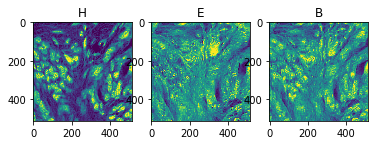

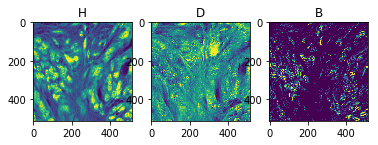

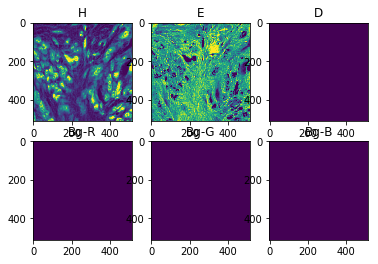

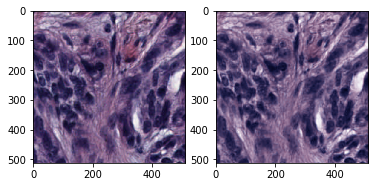

Saved model to ./models/deconv-GAN-512-40X-9/220_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 220 / 600 	 Time Taken: 91 sec
Train epoch 221
loss_G 1.356	loss_gan 0.874	loss_rec 0.482	image_loss 0.258	perceptual_loss 0.052	bg_penalty 0.013	stain_penalty 0.0	h_sparsity 0.173	e_penalty 0.131	cov_penalty -0.146	loss_D 0.072	
loss_G 1.295	loss_gan 0.837	loss_rec 0.458	image_loss 0.241	perceptual_loss 0.052	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.169	e_penalty 0.125	cov_penalty -0.139	loss_D 0.076	
loss_G 1.29	loss_gan 0.819	loss_rec 0.471	image_loss 0.251	perceptual_loss 0.053	bg_penalty 0.011	stain_penalty 0.0	h_sparsity 0.169	e_penalty 0.122	cov_penalty -0.136	loss_D 0.077	
Val epoch 221
loss_G 1.01	loss_gan 0.532	loss_rec 0.478	image_loss 0.256	perceptual_loss 0.052	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.059	e_penalty 0.114	cov_penalty -0.006	loss_D 0.085	
learning rate 0.0001000 -> 0.0001000
End of epoch 221 / 600 	 Time Taken: 104 sec
Train epoch 222
loss_

Val epoch 230
loss_G 0.977	loss_gan 0.603	loss_rec 0.374	image_loss 0.136	perceptual_loss 0.055	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.061	e_penalty 0.127	cov_penalty -0.008	loss_D 0.073	
Saved model to ./models/deconv-GAN-512-40X-9/230_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 230 / 600 	 Time Taken: 104 sec
Train epoch 231
loss_G 1.342	loss_gan 0.876	loss_rec 0.466	image_loss 0.25	perceptual_loss 0.056	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.165	e_penalty 0.113	cov_penalty -0.128	loss_D 0.053	
loss_G 1.283	loss_gan 0.835	loss_rec 0.448	image_loss 0.235	perceptual_loss 0.054	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.114	cov_penalty -0.128	loss_D 0.071	
loss_G 1.277	loss_gan 0.83	loss_rec 0.447	image_loss 0.235	perceptual_loss 0.053	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.166	e_penalty 0.117	cov_penalty -0.133	loss_D 0.075	
Val epoch 231
loss_G 1.081	loss_gan 0.7	loss_rec 0.381	image_loss 0.178	perceptual_loss 0.048	bg_penal

loss_G 1.249	loss_gan 0.8	loss_rec 0.449	image_loss 0.235	perceptual_loss 0.054	bg_penalty 0.011	stain_penalty 0.0	h_sparsity 0.167	e_penalty 0.119	cov_penalty -0.138	loss_D 0.089	
Val epoch 240
loss_G 0.772	loss_gan 0.421	loss_rec 0.35	image_loss 0.126	perceptual_loss 0.052	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.063	e_penalty 0.12	cov_penalty -0.012	loss_D 0.078	
tensor([[0.7086, 0.5936, 0.3815],
        [0.5494, 0.6909, 0.4699],
        [0.8580, 0.2021, 0.4722],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[0.4230, 0.0074],
        [0.4532, 0.0069],
        [0.4396, 0.0150]], device='cuda:0')


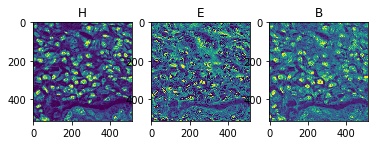

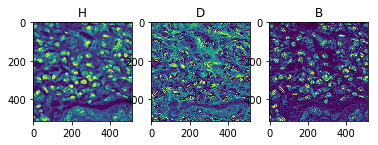

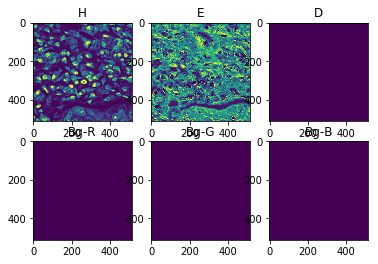

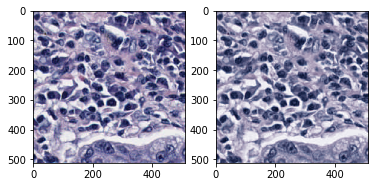

Saved model to ./models/deconv-GAN-512-40X-9/240_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 240 / 600 	 Time Taken: 107 sec
Train epoch 241
loss_G 1.301	loss_gan 0.838	loss_rec 0.463	image_loss 0.249	perceptual_loss 0.052	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.171	e_penalty 0.124	cov_penalty -0.145	loss_D 0.084	
loss_G 1.26	loss_gan 0.813	loss_rec 0.447	image_loss 0.236	perceptual_loss 0.05	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.167	e_penalty 0.114	cov_penalty -0.131	loss_D 0.078	
loss_G 1.262	loss_gan 0.818	loss_rec 0.444	image_loss 0.231	perceptual_loss 0.051	bg_penalty 0.01	stain_penalty 0.0	h_sparsity 0.169	e_penalty 0.116	cov_penalty -0.134	loss_D 0.079	
Val epoch 241
loss_G 0.74	loss_gan 0.362	loss_rec 0.378	image_loss 0.147	perceptual_loss 0.052	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.059	e_penalty 0.126	cov_penalty -0.008	loss_D 0.084	
learning rate 0.0001000 -> 0.0001000
End of epoch 241 / 600 	 Time Taken: 104 sec
Train epoch 242
loss_G

Val epoch 250
loss_G 1.343	loss_gan 1.016	loss_rec 0.327	image_loss 0.118	perceptual_loss 0.048	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.068	e_penalty 0.101	cov_penalty -0.01	loss_D 0.043	
Saved model to ./models/deconv-GAN-512-40X-9/250_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 250 / 600 	 Time Taken: 84 sec
Train epoch 251
loss_G 1.325	loss_gan 0.839	loss_rec 0.486	image_loss 0.257	perceptual_loss 0.054	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.171	e_penalty 0.127	cov_penalty -0.135	loss_D 0.059	
loss_G 1.32	loss_gan 0.839	loss_rec 0.481	image_loss 0.253	perceptual_loss 0.054	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.172	e_penalty 0.126	cov_penalty -0.136	loss_D 0.064	
loss_G 1.293	loss_gan 0.832	loss_rec 0.461	image_loss 0.237	perceptual_loss 0.053	bg_penalty 0.011	stain_penalty 0.0	h_sparsity 0.17	e_penalty 0.121	cov_penalty -0.132	loss_D 0.064	
Val epoch 251
loss_G 1.255	loss_gan 0.919	loss_rec 0.337	image_loss 0.144	perceptual_loss 0.045	bg_pena

loss_G 1.23	loss_gan 0.795	loss_rec 0.434	image_loss 0.221	perceptual_loss 0.052	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.166	e_penalty 0.116	cov_penalty -0.13	loss_D 0.094	
Val epoch 260
loss_G 0.93	loss_gan 0.549	loss_rec 0.381	image_loss 0.179	perceptual_loss 0.049	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.065	e_penalty 0.097	cov_penalty -0.012	loss_D 0.075	
tensor([[0.6835, 0.6235, 0.3795],
        [0.5384, 0.7117, 0.4513],
        [0.9037, 0.1342, 0.4065],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[ 0.5392,  0.0304],
        [-0.1793,  0.2208],
        [ 0.5765,  0.0342]], device='cuda:0')


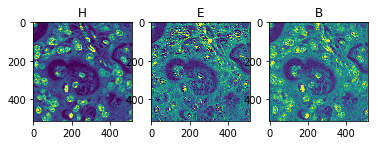

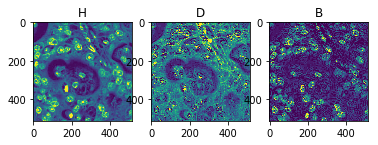

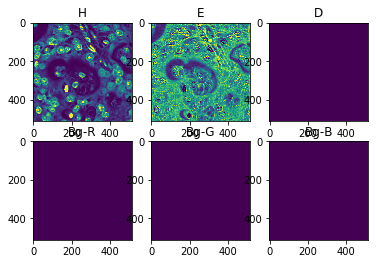

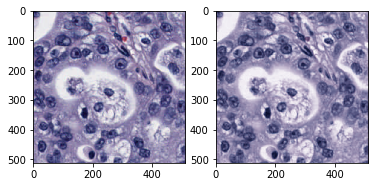

Saved model to ./models/deconv-GAN-512-40X-9/260_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 260 / 600 	 Time Taken: 105 sec
Train epoch 261
loss_G 1.255	loss_gan 0.816	loss_rec 0.439	image_loss 0.222	perceptual_loss 0.051	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.168	e_penalty 0.112	cov_penalty -0.122	loss_D 0.075	
loss_G 1.234	loss_gan 0.806	loss_rec 0.427	image_loss 0.216	perceptual_loss 0.051	bg_penalty 0.008	stain_penalty 0.0	h_sparsity 0.167	e_penalty 0.114	cov_penalty -0.127	loss_D 0.079	
loss_G 1.264	loss_gan 0.819	loss_rec 0.444	image_loss 0.228	perceptual_loss 0.051	bg_penalty 0.009	stain_penalty 0.0	h_sparsity 0.169	e_penalty 0.118	cov_penalty -0.13	loss_D 0.075	
Val epoch 261
loss_G 0.999	loss_gan 0.625	loss_rec 0.374	image_loss 0.157	perceptual_loss 0.052	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.062	e_penalty 0.109	cov_penalty -0.008	loss_D 0.076	
learning rate 0.0001000 -> 0.0001000
End of epoch 261 / 600 	 Time Taken: 104 sec
Train epoch 262
lo

Val epoch 270
loss_G 0.977	loss_gan 0.613	loss_rec 0.364	image_loss 0.148	perceptual_loss 0.05	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.061	e_penalty 0.112	cov_penalty -0.009	loss_D 0.062	
Saved model to ./models/deconv-GAN-512-40X-9/270_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 270 / 600 	 Time Taken: 105 sec
Train epoch 271
loss_G 1.308	loss_gan 0.823	loss_rec 0.485	image_loss 0.248	perceptual_loss 0.053	bg_penalty 0.018	stain_penalty 0.0	h_sparsity 0.176	e_penalty 0.139	cov_penalty -0.148	loss_D 0.076	
loss_G 1.275	loss_gan 0.815	loss_rec 0.46	image_loss 0.229	perceptual_loss 0.053	bg_penalty 0.015	stain_penalty 0.0	h_sparsity 0.172	e_penalty 0.131	cov_penalty -0.141	loss_D 0.083	
loss_G 1.267	loss_gan 0.812	loss_rec 0.455	image_loss 0.229	perceptual_loss 0.052	bg_penalty 0.013	stain_penalty 0.0	h_sparsity 0.172	e_penalty 0.128	cov_penalty -0.139	loss_D 0.079	
Val epoch 271
loss_G 0.859	loss_gan 0.486	loss_rec 0.373	image_loss 0.148	perceptual_loss 0.053	bg_pe

loss_G 1.272	loss_gan 0.812	loss_rec 0.46	image_loss 0.238	perceptual_loss 0.053	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.172	e_penalty 0.129	cov_penalty -0.144	loss_D 0.079	
Val epoch 280
loss_G 1.352	loss_gan 0.944	loss_rec 0.408	image_loss 0.194	perceptual_loss 0.054	bg_penalty 0.003	stain_penalty 0.0	h_sparsity 0.064	e_penalty 0.104	cov_penalty -0.011	loss_D 0.055	
tensor([[0.7049, 0.5943, 0.3873],
        [0.5781, 0.6818, 0.4482],
        [0.8295, 0.1548, 0.5366],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[0.4272, 0.0354],
        [0.4201, 0.0262],
        [0.4083, 0.0274]], device='cuda:0')


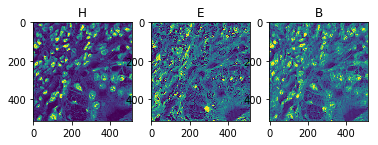

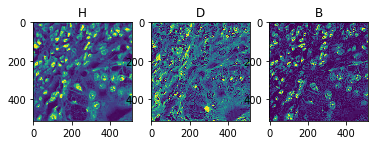

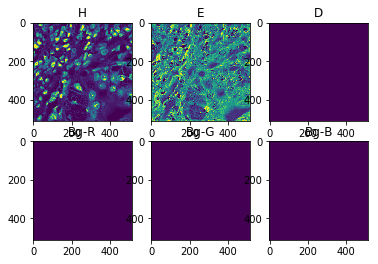

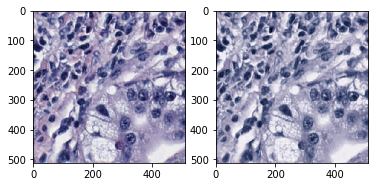

Saved model to ./models/deconv-GAN-512-40X-9/280_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 280 / 600 	 Time Taken: 94 sec
Train epoch 281
loss_G 1.214	loss_gan 0.8	loss_rec 0.414	image_loss 0.201	perceptual_loss 0.05	bg_penalty 0.011	stain_penalty 0.0	h_sparsity 0.171	e_penalty 0.116	cov_penalty -0.135	loss_D 0.067	
loss_G 1.257	loss_gan 0.822	loss_rec 0.435	image_loss 0.219	perceptual_loss 0.051	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.172	e_penalty 0.125	cov_penalty -0.144	loss_D 0.081	
loss_G 1.276	loss_gan 0.834	loss_rec 0.442	image_loss 0.224	perceptual_loss 0.05	bg_penalty 0.013	stain_penalty 0.0	h_sparsity 0.173	e_penalty 0.126	cov_penalty -0.143	loss_D 0.072	
Val epoch 281
loss_G 1.058	loss_gan 0.689	loss_rec 0.369	image_loss 0.17	perceptual_loss 0.049	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.07	e_penalty 0.093	cov_penalty -0.016	loss_D 0.042	
learning rate 0.0001000 -> 0.0001000
End of epoch 281 / 600 	 Time Taken: 85 sec
Train epoch 282
loss_G 1.

Val epoch 290
loss_G 1.232	loss_gan 0.884	loss_rec 0.348	image_loss 0.154	perceptual_loss 0.054	bg_penalty 0.001	stain_penalty 0.0	h_sparsity 0.089	e_penalty 0.072	cov_penalty -0.022	loss_D 0.076	
Saved model to ./models/deconv-GAN-512-40X-9/290_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 290 / 600 	 Time Taken: 104 sec
Train epoch 291
loss_G 1.284	loss_gan 0.834	loss_rec 0.45	image_loss 0.234	perceptual_loss 0.05	bg_penalty 0.013	stain_penalty 0.0	h_sparsity 0.173	e_penalty 0.126	cov_penalty -0.147	loss_D 0.077	
loss_G 1.27	loss_gan 0.824	loss_rec 0.445	image_loss 0.228	perceptual_loss 0.052	bg_penalty 0.013	stain_penalty 0.0	h_sparsity 0.171	e_penalty 0.123	cov_penalty -0.141	loss_D 0.074	
loss_G 1.294	loss_gan 0.827	loss_rec 0.467	image_loss 0.245	perceptual_loss 0.052	bg_penalty 0.014	stain_penalty 0.0	h_sparsity 0.173	e_penalty 0.126	cov_penalty -0.143	loss_D 0.074	
Val epoch 291
loss_G 0.966	loss_gan 0.552	loss_rec 0.414	image_loss 0.19	perceptual_loss 0.05	bg_penal

loss_G 1.284	loss_gan 0.827	loss_rec 0.458	image_loss 0.236	perceptual_loss 0.053	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.173	e_penalty 0.13	cov_penalty -0.147	loss_D 0.076	
Val epoch 300
loss_G 1.142	loss_gan 0.746	loss_rec 0.396	image_loss 0.18	perceptual_loss 0.055	bg_penalty 0.002	stain_penalty 0.0	h_sparsity 0.064	e_penalty 0.113	cov_penalty -0.018	loss_D 0.03	
tensor([[0.6098, 0.6828, 0.4024],
        [0.3384, 0.7730, 0.5367],
        [0.9281, 0.1010, 0.3583],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[0.4169, 0.0464],
        [0.3658, 0.0413],
        [0.3266, 0.0264]], device='cuda:0')


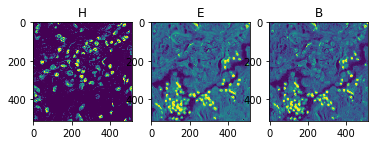

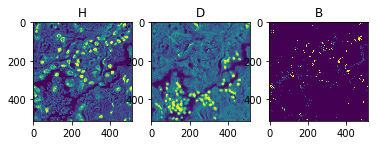

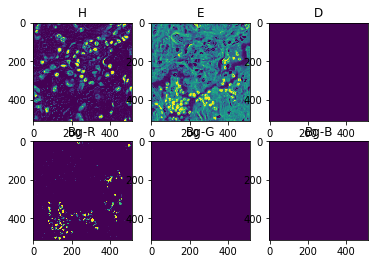

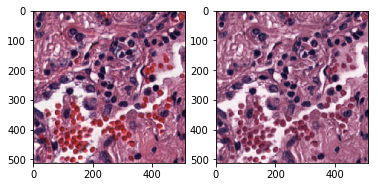

Saved model to ./models/deconv-GAN-512-40X-9/300_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 300 / 600 	 Time Taken: 105 sec
Train epoch 301
loss_G 1.264	loss_gan 0.832	loss_rec 0.432	image_loss 0.215	perceptual_loss 0.052	bg_penalty 0.013	stain_penalty 0.0	h_sparsity 0.17	e_penalty 0.126	cov_penalty -0.143	loss_D 0.077	
loss_G 1.255	loss_gan 0.812	loss_rec 0.443	image_loss 0.225	perceptual_loss 0.053	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.17	e_penalty 0.125	cov_penalty -0.141	loss_D 0.075	
loss_G 1.257	loss_gan 0.812	loss_rec 0.445	image_loss 0.224	perceptual_loss 0.054	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.172	e_penalty 0.129	cov_penalty -0.147	loss_D 0.075	
Val epoch 301
loss_G 1.137	loss_gan 0.74	loss_rec 0.397	image_loss 0.165	perceptual_loss 0.054	bg_penalty 0.003	stain_penalty 0.0	h_sparsity 0.056	e_penalty 0.127	cov_penalty -0.008	loss_D 0.067	
learning rate 0.0001000 -> 0.0001000
End of epoch 301 / 600 	 Time Taken: 105 sec
Train epoch 302
loss

Val epoch 310
loss_G 0.683	loss_gan 0.201	loss_rec 0.482	image_loss 0.231	perceptual_loss 0.077	bg_penalty 0.005	stain_penalty 0.0	h_sparsity 0.062	e_penalty 0.128	cov_penalty -0.021	loss_D 0.176	
Saved model to ./models/deconv-GAN-512-40X-9/310_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 310 / 600 	 Time Taken: 93 sec
Train epoch 311
loss_G 1.324	loss_gan 0.724	loss_rec 0.6	image_loss 0.322	perceptual_loss 0.074	bg_penalty 0.024	stain_penalty 0.0	h_sparsity 0.165	e_penalty 0.153	cov_penalty -0.138	loss_D 0.108	
loss_G 1.332	loss_gan 0.721	loss_rec 0.611	image_loss 0.331	perceptual_loss 0.075	bg_penalty 0.024	stain_penalty 0.0	h_sparsity 0.165	e_penalty 0.151	cov_penalty -0.136	loss_D 0.109	
loss_G 1.319	loss_gan 0.722	loss_rec 0.597	image_loss 0.319	perceptual_loss 0.074	bg_penalty 0.024	stain_penalty 0.0	h_sparsity 0.165	e_penalty 0.15	cov_penalty -0.135	loss_D 0.106	
Val epoch 311
loss_G 0.905	loss_gan 0.46	loss_rec 0.445	image_loss 0.192	perceptual_loss 0.079	bg_penal

loss_G 1.376	loss_gan 0.756	loss_rec 0.619	image_loss 0.327	perceptual_loss 0.076	bg_penalty 0.032	stain_penalty 0.0	h_sparsity 0.168	e_penalty 0.168	cov_penalty -0.151	loss_D 0.099	
Val epoch 320
loss_G 0.864	loss_gan 0.337	loss_rec 0.527	image_loss 0.253	perceptual_loss 0.084	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.056	e_penalty 0.136	cov_penalty -0.014	loss_D 0.115	
tensor([[0.6846, 0.6059, 0.4053],
        [0.5737, 0.6821, 0.4534],
        [0.6707, 0.1486, 0.7267],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[4.7592e-01, 4.8551e-03],
        [4.7957e-01, 9.9818e-03],
        [4.5496e-01, 8.2573e-05]], device='cuda:0')


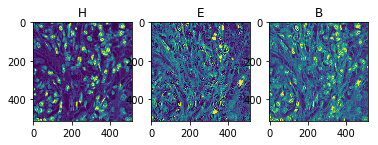

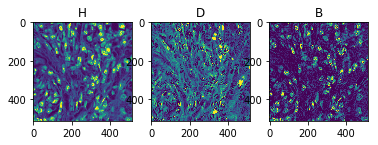

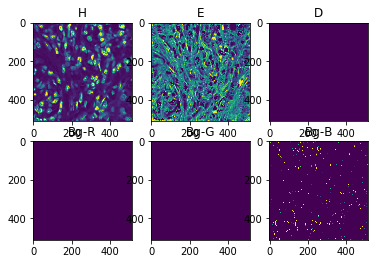

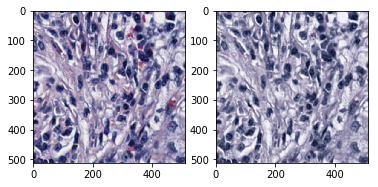

Saved model to ./models/deconv-GAN-512-40X-9/320_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 320 / 600 	 Time Taken: 105 sec
Train epoch 321
loss_G 1.329	loss_gan 0.705	loss_rec 0.624	image_loss 0.325	perceptual_loss 0.079	bg_penalty 0.036	stain_penalty 0.0	h_sparsity 0.163	e_penalty 0.159	cov_penalty -0.138	loss_D 0.129	
loss_G 1.349	loss_gan 0.725	loss_rec 0.624	image_loss 0.329	perceptual_loss 0.078	bg_penalty 0.036	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.157	cov_penalty -0.138	loss_D 0.121	
loss_G 1.346	loss_gan 0.723	loss_rec 0.624	image_loss 0.328	perceptual_loss 0.078	bg_penalty 0.035	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.158	cov_penalty -0.138	loss_D 0.115	
Val epoch 321
loss_G 0.759	loss_gan 0.304	loss_rec 0.455	image_loss 0.198	perceptual_loss 0.078	bg_penalty 0.011	stain_penalty 0.0	h_sparsity 0.061	e_penalty 0.129	cov_penalty -0.021	loss_D 0.16	
learning rate 0.0001000 -> 0.0001000
End of epoch 321 / 600 	 Time Taken: 104 sec
Train epoch 322
lo

Val epoch 330
loss_G 0.795	loss_gan 0.336	loss_rec 0.459	image_loss 0.192	perceptual_loss 0.084	bg_penalty 0.011	stain_penalty 0.0	h_sparsity 0.061	e_penalty 0.131	cov_penalty -0.019	loss_D 0.126	
Saved model to ./models/deconv-GAN-512-40X-9/330_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 330 / 600 	 Time Taken: 103 sec
Train epoch 331
loss_G 1.315	loss_gan 0.69	loss_rec 0.625	image_loss 0.323	perceptual_loss 0.079	bg_penalty 0.035	stain_penalty 0.0	h_sparsity 0.158	e_penalty 0.153	cov_penalty -0.123	loss_D 0.12	
loss_G 1.342	loss_gan 0.693	loss_rec 0.648	image_loss 0.343	perceptual_loss 0.078	bg_penalty 0.036	stain_penalty 0.0	h_sparsity 0.161	e_penalty 0.161	cov_penalty -0.132	loss_D 0.112	
loss_G 1.351	loss_gan 0.713	loss_rec 0.638	image_loss 0.332	perceptual_loss 0.079	bg_penalty 0.037	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.163	cov_penalty -0.134	loss_D 0.106	
Val epoch 331
loss_G 0.844	loss_gan 0.343	loss_rec 0.5	image_loss 0.243	perceptual_loss 0.078	bg_pena

loss_G 1.361	loss_gan 0.747	loss_rec 0.614	image_loss 0.314	perceptual_loss 0.078	bg_penalty 0.038	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.166	cov_penalty -0.145	loss_D 0.106	
Val epoch 340
loss_G 1.099	loss_gan 0.636	loss_rec 0.463	image_loss 0.207	perceptual_loss 0.075	bg_penalty 0.016	stain_penalty 0.0	h_sparsity 0.062	e_penalty 0.121	cov_penalty -0.019	loss_D 0.089	
tensor([[0.6582, 0.6272, 0.4163],
        [0.5017, 0.7199, 0.4796],
        [0.7484, 0.1359, 0.6492],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[0.4153, 0.0225],
        [0.4645, 0.0284],
        [0.4535, 0.0357]], device='cuda:0')


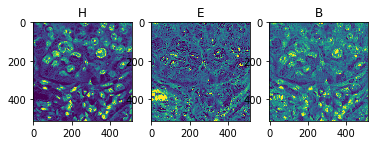

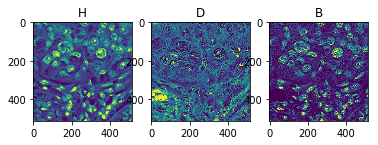

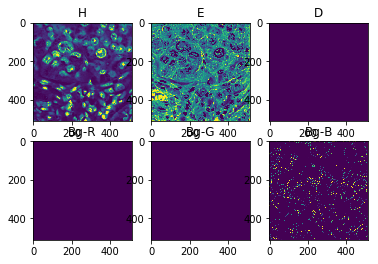

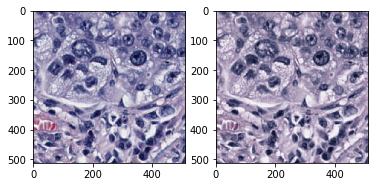

Saved model to ./models/deconv-GAN-512-40X-9/340_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 340 / 600 	 Time Taken: 90 sec
Train epoch 341
loss_G 1.387	loss_gan 0.776	loss_rec 0.611	image_loss 0.309	perceptual_loss 0.072	bg_penalty 0.04	stain_penalty 0.0	h_sparsity 0.165	e_penalty 0.171	cov_penalty -0.145	loss_D 0.1	
loss_G 1.365	loss_gan 0.733	loss_rec 0.631	image_loss 0.328	perceptual_loss 0.076	bg_penalty 0.038	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.166	cov_penalty -0.141	loss_D 0.119	
loss_G 1.368	loss_gan 0.72	loss_rec 0.648	image_loss 0.339	perceptual_loss 0.076	bg_penalty 0.041	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.17	cov_penalty -0.143	loss_D 0.118	
Val epoch 341
loss_G 1.069	loss_gan 0.595	loss_rec 0.474	image_loss 0.196	perceptual_loss 0.081	bg_penalty 0.016	stain_penalty 0.0	h_sparsity 0.057	e_penalty 0.145	cov_penalty -0.021	loss_D 0.07	
learning rate 0.0001000 -> 0.0001000
End of epoch 341 / 600 	 Time Taken: 92 sec
Train epoch 342
loss_G 1.

Val epoch 350
loss_G 0.633	loss_gan 0.173	loss_rec 0.46	image_loss 0.214	perceptual_loss 0.072	bg_penalty 0.011	stain_penalty 0.0	h_sparsity 0.061	e_penalty 0.124	cov_penalty -0.022	loss_D 0.198	
Saved model to ./models/deconv-GAN-512-40X-9/350_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 350 / 600 	 Time Taken: 103 sec
Train epoch 351
loss_G 1.439	loss_gan 0.738	loss_rec 0.701	image_loss 0.392	perceptual_loss 0.079	bg_penalty 0.04	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.17	cov_penalty -0.144	loss_D 0.106	
loss_G 1.395	loss_gan 0.727	loss_rec 0.668	image_loss 0.358	perceptual_loss 0.08	bg_penalty 0.04	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.175	cov_penalty -0.149	loss_D 0.105	
loss_G 1.364	loss_gan 0.706	loss_rec 0.659	image_loss 0.348	perceptual_loss 0.079	bg_penalty 0.041	stain_penalty 0.0	h_sparsity 0.163	e_penalty 0.173	cov_penalty -0.144	loss_D 0.108	
Val epoch 351
loss_G 0.798	loss_gan 0.338	loss_rec 0.46	image_loss 0.183	perceptual_loss 0.075	bg_penalt

loss_G 1.354	loss_gan 0.72	loss_rec 0.634	image_loss 0.325	perceptual_loss 0.078	bg_penalty 0.04	stain_penalty 0.0	h_sparsity 0.163	e_penalty 0.173	cov_penalty -0.145	loss_D 0.108	
Val epoch 360
loss_G 0.903	loss_gan 0.429	loss_rec 0.474	image_loss 0.215	perceptual_loss 0.079	bg_penalty 0.016	stain_penalty 0.0	h_sparsity 0.063	e_penalty 0.131	cov_penalty -0.03	loss_D 0.113	
tensor([[0.5862, 0.6864, 0.4304],
        [0.3522, 0.7780, 0.5202],
        [0.8809, 0.1011, 0.4624],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[0.5144, 0.0193],
        [0.4973, 0.0154],
        [0.5228, 0.0180]], device='cuda:0')


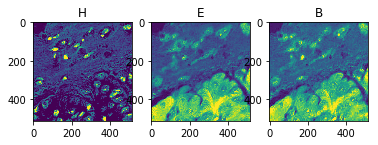

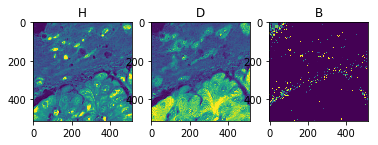

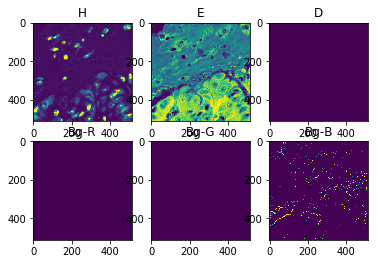

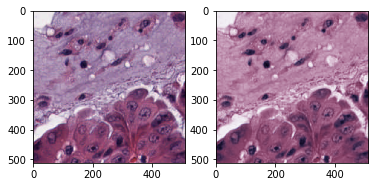

Saved model to ./models/deconv-GAN-512-40X-9/360_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 360 / 600 	 Time Taken: 106 sec
Train epoch 361
loss_G 1.388	loss_gan 0.742	loss_rec 0.647	image_loss 0.338	perceptual_loss 0.077	bg_penalty 0.04	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.172	cov_penalty -0.145	loss_D 0.116	
loss_G 1.382	loss_gan 0.744	loss_rec 0.638	image_loss 0.326	perceptual_loss 0.076	bg_penalty 0.042	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.179	cov_penalty -0.149	loss_D 0.104	
loss_G 1.394	loss_gan 0.734	loss_rec 0.66	image_loss 0.348	perceptual_loss 0.077	bg_penalty 0.042	stain_penalty 0.0	h_sparsity 0.166	e_penalty 0.179	cov_penalty -0.151	loss_D 0.104	
Val epoch 361
loss_G 1.069	loss_gan 0.402	loss_rec 0.667	image_loss 0.39	perceptual_loss 0.089	bg_penalty 0.014	stain_penalty 0.0	h_sparsity 0.053	e_penalty 0.131	cov_penalty -0.01	loss_D 0.115	
learning rate 0.0001000 -> 0.0001000
End of epoch 361 / 600 	 Time Taken: 104 sec
Train epoch 362
loss_

Val epoch 370
loss_G 0.757	loss_gan 0.238	loss_rec 0.519	image_loss 0.238	perceptual_loss 0.076	bg_penalty 0.019	stain_penalty 0.0	h_sparsity 0.053	e_penalty 0.152	cov_penalty -0.019	loss_D 0.134	
Saved model to ./models/deconv-GAN-512-40X-9/370_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 370 / 600 	 Time Taken: 83 sec
Train epoch 371
loss_G 1.451	loss_gan 0.799	loss_rec 0.652	image_loss 0.344	perceptual_loss 0.075	bg_penalty 0.04	stain_penalty 0.0	h_sparsity 0.163	e_penalty 0.174	cov_penalty -0.144	loss_D 0.097	
loss_G 1.414	loss_gan 0.784	loss_rec 0.63	image_loss 0.324	perceptual_loss 0.074	bg_penalty 0.041	stain_penalty 0.0	h_sparsity 0.167	e_penalty 0.181	cov_penalty -0.156	loss_D 0.102	
loss_G 1.377	loss_gan 0.749	loss_rec 0.628	image_loss 0.32	perceptual_loss 0.075	bg_penalty 0.04	stain_penalty 0.0	h_sparsity 0.165	e_penalty 0.176	cov_penalty -0.149	loss_D 0.102	
Val epoch 371
loss_G 0.766	loss_gan 0.318	loss_rec 0.448	image_loss 0.191	perceptual_loss 0.076	bg_penal

loss_G 1.406	loss_gan 0.77	loss_rec 0.637	image_loss 0.327	perceptual_loss 0.075	bg_penalty 0.041	stain_penalty 0.0	h_sparsity 0.165	e_penalty 0.176	cov_penalty -0.147	loss_D 0.087	
Val epoch 380
loss_G 0.812	loss_gan 0.385	loss_rec 0.427	image_loss 0.188	perceptual_loss 0.066	bg_penalty 0.013	stain_penalty 0.0	h_sparsity 0.065	e_penalty 0.115	cov_penalty -0.02	loss_D 0.133	
tensor([[0.5886, 0.6776, 0.4410],
        [0.3546, 0.7640, 0.5391],
        [0.9117, 0.0901, 0.4008],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[0.5010, 0.0086],
        [0.4672, 0.0029],
        [0.4770, 0.0042]], device='cuda:0')


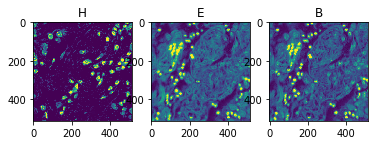

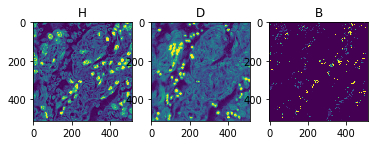

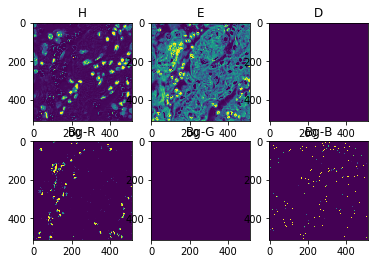

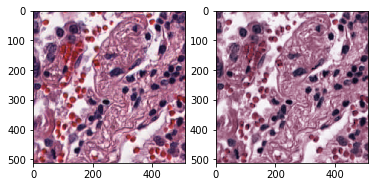

Saved model to ./models/deconv-GAN-512-40X-9/380_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 380 / 600 	 Time Taken: 107 sec
Train epoch 381
loss_G 1.333	loss_gan 0.728	loss_rec 0.605	image_loss 0.301	perceptual_loss 0.076	bg_penalty 0.035	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.171	cov_penalty -0.141	loss_D 0.099	
loss_G 1.333	loss_gan 0.722	loss_rec 0.611	image_loss 0.305	perceptual_loss 0.076	bg_penalty 0.039	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.175	cov_penalty -0.148	loss_D 0.099	
loss_G 1.326	loss_gan 0.716	loss_rec 0.61	image_loss 0.304	perceptual_loss 0.075	bg_penalty 0.039	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.174	cov_penalty -0.146	loss_D 0.106	
Val epoch 381
loss_G 0.801	loss_gan 0.338	loss_rec 0.463	image_loss 0.178	perceptual_loss 0.082	bg_penalty 0.02	stain_penalty 0.0	h_sparsity 0.053	e_penalty 0.148	cov_penalty -0.018	loss_D 0.148	
learning rate 0.0001000 -> 0.0001000
End of epoch 381 / 600 	 Time Taken: 104 sec
Train epoch 382
los

Val epoch 390
loss_G 0.705	loss_gan 0.268	loss_rec 0.437	image_loss 0.174	perceptual_loss 0.073	bg_penalty 0.016	stain_penalty 0.0	h_sparsity 0.062	e_penalty 0.138	cov_penalty -0.026	loss_D 0.138	
Saved model to ./models/deconv-GAN-512-40X-9/390_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 390 / 600 	 Time Taken: 104 sec
Train epoch 391
loss_G 1.325	loss_gan 0.702	loss_rec 0.622	image_loss 0.313	perceptual_loss 0.075	bg_penalty 0.045	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.18	cov_penalty -0.155	loss_D 0.14	
loss_G 1.312	loss_gan 0.696	loss_rec 0.615	image_loss 0.31	perceptual_loss 0.075	bg_penalty 0.042	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.177	cov_penalty -0.151	loss_D 0.127	
loss_G 1.33	loss_gan 0.708	loss_rec 0.622	image_loss 0.316	perceptual_loss 0.076	bg_penalty 0.042	stain_penalty 0.0	h_sparsity 0.163	e_penalty 0.178	cov_penalty -0.151	loss_D 0.119	
Val epoch 391
loss_G 0.612	loss_gan 0.176	loss_rec 0.435	image_loss 0.187	perceptual_loss 0.07	bg_penal

loss_G 1.358	loss_gan 0.736	loss_rec 0.622	image_loss 0.312	perceptual_loss 0.075	bg_penalty 0.042	stain_penalty 0.0	h_sparsity 0.161	e_penalty 0.175	cov_penalty -0.144	loss_D 0.099	
Val epoch 400
loss_G 0.852	loss_gan 0.345	loss_rec 0.506	image_loss 0.243	perceptual_loss 0.067	bg_penalty 0.016	stain_penalty 0.0	h_sparsity 0.054	e_penalty 0.145	cov_penalty -0.017	loss_D 0.147	
tensor([[0.6051, 0.6722, 0.4266],
        [0.3541, 0.7658, 0.5368],
        [0.8991, 0.0941, 0.4276],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[0.5783, 0.0147],
        [0.5503, 0.0132],
        [0.5200, 0.0115]], device='cuda:0')


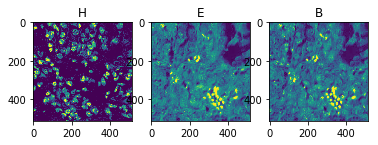

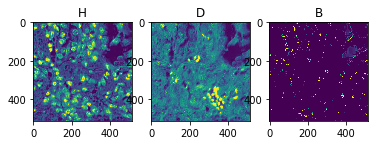

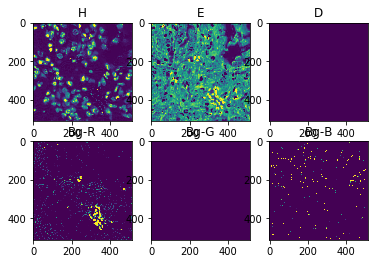

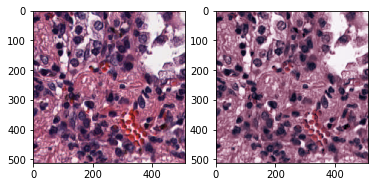

Saved model to ./models/deconv-GAN-512-40X-9/400_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 400 / 600 	 Time Taken: 90 sec
Train epoch 401
loss_G 1.314	loss_gan 0.7	loss_rec 0.614	image_loss 0.308	perceptual_loss 0.077	bg_penalty 0.04	stain_penalty 0.0	h_sparsity 0.155	e_penalty 0.164	cov_penalty -0.13	loss_D 0.111	
loss_G 1.378	loss_gan 0.73	loss_rec 0.648	image_loss 0.335	perceptual_loss 0.079	bg_penalty 0.045	stain_penalty 0.0	h_sparsity 0.16	e_penalty 0.173	cov_penalty -0.143	loss_D 0.101	
loss_G 1.376	loss_gan 0.737	loss_rec 0.638	image_loss 0.328	perceptual_loss 0.077	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.176	cov_penalty -0.15	loss_D 0.099	
Val epoch 401
loss_G 0.898	loss_gan 0.296	loss_rec 0.602	image_loss 0.301	perceptual_loss 0.087	bg_penalty 0.019	stain_penalty 0.0	h_sparsity 0.045	e_penalty 0.161	cov_penalty -0.011	loss_D 0.13	
learning rate 0.0001000 -> 0.0001000
End of epoch 401 / 600 	 Time Taken: 93 sec
Train epoch 402
loss_G 1.38

Val epoch 410
loss_G 0.784	loss_gan 0.283	loss_rec 0.501	image_loss 0.221	perceptual_loss 0.086	bg_penalty 0.015	stain_penalty 0.0	h_sparsity 0.054	e_penalty 0.145	cov_penalty -0.02	loss_D 0.151	
Saved model to ./models/deconv-GAN-512-40X-9/410_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 410 / 600 	 Time Taken: 104 sec
Train epoch 411
loss_G 1.439	loss_gan 0.803	loss_rec 0.637	image_loss 0.315	perceptual_loss 0.079	bg_penalty 0.047	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.186	cov_penalty -0.154	loss_D 0.087	
loss_G 1.415	loss_gan 0.792	loss_rec 0.623	image_loss 0.312	perceptual_loss 0.076	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.179	cov_penalty -0.151	loss_D 0.095	
loss_G 1.41	loss_gan 0.789	loss_rec 0.622	image_loss 0.313	perceptual_loss 0.076	bg_penalty 0.041	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.178	cov_penalty -0.15	loss_D 0.088	
Val epoch 411
loss_G 1.024	loss_gan 0.541	loss_rec 0.483	image_loss 0.197	perceptual_loss 0.076	bg_pen

loss_G 1.361	loss_gan 0.744	loss_rec 0.617	image_loss 0.305	perceptual_loss 0.075	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.16	e_penalty 0.177	cov_penalty -0.144	loss_D 0.096	
Val epoch 420
loss_G 1.452	loss_gan 0.819	loss_rec 0.632	image_loss 0.375	perceptual_loss 0.07	bg_penalty 0.017	stain_penalty 0.0	h_sparsity 0.053	e_penalty 0.13	cov_penalty -0.012	loss_D 0.072	
tensor([[0.6750, 0.6280, 0.3873],
        [0.5233, 0.7210, 0.4543],
        [0.7132, 0.1169, 0.6912],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[0.5260, 0.0160],
        [0.5264, 0.0171],
        [0.5279, 0.0160]], device='cuda:0')


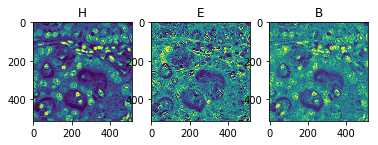

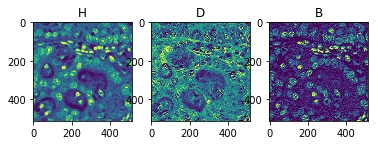

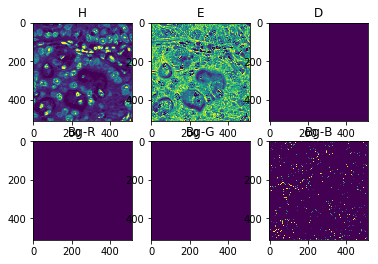

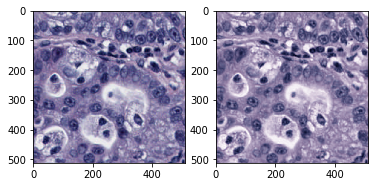

Saved model to ./models/deconv-GAN-512-40X-9/420_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 420 / 600 	 Time Taken: 106 sec
Train epoch 421
loss_G 1.385	loss_gan 0.777	loss_rec 0.609	image_loss 0.302	perceptual_loss 0.072	bg_penalty 0.043	stain_penalty 0.0	h_sparsity 0.165	e_penalty 0.175	cov_penalty -0.148	loss_D 0.084	
loss_G 1.405	loss_gan 0.764	loss_rec 0.641	image_loss 0.328	perceptual_loss 0.076	bg_penalty 0.042	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.173	cov_penalty -0.14	loss_D 0.089	
loss_G 1.383	loss_gan 0.747	loss_rec 0.636	image_loss 0.323	perceptual_loss 0.076	bg_penalty 0.042	stain_penalty 0.0	h_sparsity 0.161	e_penalty 0.174	cov_penalty -0.141	loss_D 0.094	
Val epoch 421
loss_G 0.608	loss_gan 0.156	loss_rec 0.452	image_loss 0.194	perceptual_loss 0.071	bg_penalty 0.015	stain_penalty 0.0	h_sparsity 0.062	e_penalty 0.131	cov_penalty -0.021	loss_D 0.23	
learning rate 0.0001000 -> 0.0001000
End of epoch 421 / 600 	 Time Taken: 103 sec
Train epoch 422
los

Val epoch 430
loss_G 0.833	loss_gan 0.363	loss_rec 0.469	image_loss 0.179	perceptual_loss 0.077	bg_penalty 0.017	stain_penalty 0.0	h_sparsity 0.051	e_penalty 0.158	cov_penalty -0.012	loss_D 0.094	
Saved model to ./models/deconv-GAN-512-40X-9/430_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 430 / 600 	 Time Taken: 90 sec
Train epoch 431
loss_G 1.346	loss_gan 0.728	loss_rec 0.618	image_loss 0.301	perceptual_loss 0.076	bg_penalty 0.045	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.183	cov_penalty -0.15	loss_D 0.096	
loss_G 1.374	loss_gan 0.733	loss_rec 0.64	image_loss 0.323	perceptual_loss 0.075	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.185	cov_penalty -0.148	loss_D 0.098	
loss_G 1.375	loss_gan 0.736	loss_rec 0.639	image_loss 0.32	perceptual_loss 0.076	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.16	e_penalty 0.181	cov_penalty -0.142	loss_D 0.098	
Val epoch 431
loss_G 0.741	loss_gan 0.262	loss_rec 0.479	image_loss 0.206	perceptual_loss 0.074	bg_penal

loss_G 1.45	loss_gan 0.812	loss_rec 0.639	image_loss 0.318	perceptual_loss 0.077	bg_penalty 0.046	stain_penalty 0.0	h_sparsity 0.169	e_penalty 0.192	cov_penalty -0.162	loss_D 0.08	
Val epoch 440
loss_G 1.142	loss_gan 0.715	loss_rec 0.426	image_loss 0.183	perceptual_loss 0.073	bg_penalty 0.015	stain_penalty 0.0	h_sparsity 0.07	e_penalty 0.112	cov_penalty -0.026	loss_D 0.142	
tensor([[0.6319, 0.6598, 0.4067],
        [0.4297, 0.7474, 0.5067],
        [0.8437, 0.0989, 0.5276],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[0.5020, 0.0091],
        [0.4948, 0.0130],
        [0.5023, 0.0138]], device='cuda:0')


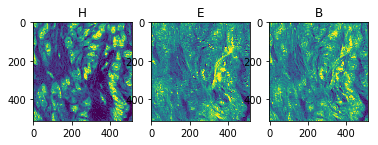

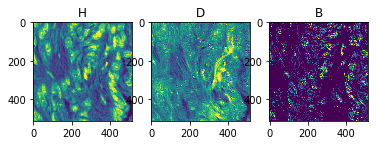

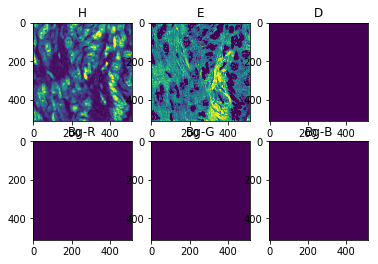

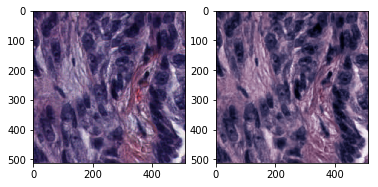

Saved model to ./models/deconv-GAN-512-40X-9/440_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 440 / 600 	 Time Taken: 105 sec
Train epoch 441
loss_G 1.325	loss_gan 0.719	loss_rec 0.606	image_loss 0.295	perceptual_loss 0.077	bg_penalty 0.043	stain_penalty 0.0	h_sparsity 0.16	e_penalty 0.174	cov_penalty -0.143	loss_D 0.102	
loss_G 1.378	loss_gan 0.735	loss_rec 0.642	image_loss 0.324	perceptual_loss 0.077	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.177	cov_penalty -0.143	loss_D 0.104	
loss_G 1.366	loss_gan 0.734	loss_rec 0.633	image_loss 0.313	perceptual_loss 0.078	bg_penalty 0.045	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.183	cov_penalty -0.15	loss_D 0.105	
Val epoch 441
loss_G 1.032	loss_gan 0.557	loss_rec 0.475	image_loss 0.195	perceptual_loss 0.078	bg_penalty 0.016	stain_penalty 0.0	h_sparsity 0.057	e_penalty 0.144	cov_penalty -0.015	loss_D 0.098	
learning rate 0.0001000 -> 0.0001000
End of epoch 441 / 600 	 Time Taken: 105 sec
Train epoch 442
los

Val epoch 450
loss_G 1.272	loss_gan 0.814	loss_rec 0.458	image_loss 0.195	perceptual_loss 0.081	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.063	e_penalty 0.125	cov_penalty -0.018	loss_D 0.103	
Saved model to ./models/deconv-GAN-512-40X-9/450_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 450 / 600 	 Time Taken: 104 sec
Train epoch 451
loss_G 1.379	loss_gan 0.767	loss_rec 0.612	image_loss 0.297	perceptual_loss 0.076	bg_penalty 0.047	stain_penalty 0.0	h_sparsity 0.16	e_penalty 0.183	cov_penalty -0.15	loss_D 0.085	
loss_G 1.37	loss_gan 0.756	loss_rec 0.613	image_loss 0.301	perceptual_loss 0.075	bg_penalty 0.046	stain_penalty 0.0	h_sparsity 0.158	e_penalty 0.179	cov_penalty -0.146	loss_D 0.098	
loss_G 1.382	loss_gan 0.756	loss_rec 0.626	image_loss 0.309	perceptual_loss 0.078	bg_penalty 0.046	stain_penalty 0.0	h_sparsity 0.16	e_penalty 0.182	cov_penalty -0.148	loss_D 0.096	
Val epoch 451
loss_G 0.797	loss_gan 0.312	loss_rec 0.485	image_loss 0.203	perceptual_loss 0.079	bg_pena

loss_G 1.391	loss_gan 0.764	loss_rec 0.627	image_loss 0.308	perceptual_loss 0.075	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.188	cov_penalty -0.152	loss_D 0.082	
Val epoch 460
loss_G 0.901	loss_gan 0.498	loss_rec 0.403	image_loss 0.159	perceptual_loss 0.064	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.069	e_penalty 0.114	cov_penalty -0.015	loss_D 0.09	
tensor([[0.5935, 0.6896, 0.4150],
        [0.3531, 0.7729, 0.5273],
        [0.9057, 0.0946, 0.4131],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[ 0.4846, -0.0035],
        [ 0.4790, -0.0021],
        [ 0.4871, -0.0034]], device='cuda:0')


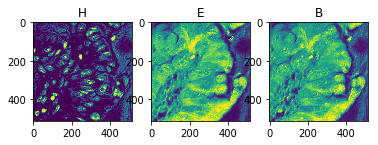

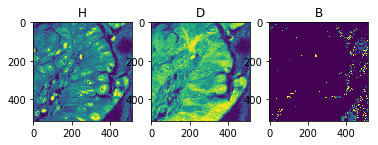

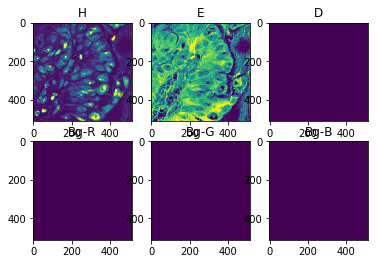

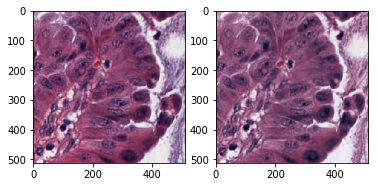

Saved model to ./models/deconv-GAN-512-40X-9/460_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 460 / 600 	 Time Taken: 106 sec
Train epoch 461
loss_G 1.435	loss_gan 0.81	loss_rec 0.625	image_loss 0.31	perceptual_loss 0.077	bg_penalty 0.042	stain_penalty 0.0	h_sparsity 0.16	e_penalty 0.179	cov_penalty -0.143	loss_D 0.105	
loss_G 1.541	loss_gan 0.888	loss_rec 0.653	image_loss 0.333	perceptual_loss 0.076	bg_penalty 0.045	stain_penalty 0.0	h_sparsity 0.159	e_penalty 0.176	cov_penalty -0.137	loss_D 0.083	
loss_G 1.532	loss_gan 0.898	loss_rec 0.634	image_loss 0.318	perceptual_loss 0.073	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.179	cov_penalty -0.14	loss_D 0.072	
Val epoch 461
loss_G 1.554	loss_gan 1.15	loss_rec 0.405	image_loss 0.166	perceptual_loss 0.059	bg_penalty 0.013	stain_penalty 0.0	h_sparsity 0.073	e_penalty 0.107	cov_penalty -0.014	loss_D 0.036	
learning rate 0.0001000 -> 0.0001000
End of epoch 461 / 600 	 Time Taken: 85 sec
Train epoch 462
loss_G 

Val epoch 470
loss_G 0.972	loss_gan 0.49	loss_rec 0.482	image_loss 0.188	perceptual_loss 0.083	bg_penalty 0.012	stain_penalty 0.0	h_sparsity 0.059	e_penalty 0.15	cov_penalty -0.011	loss_D 0.086	
Saved model to ./models/deconv-GAN-512-40X-9/470_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 470 / 600 	 Time Taken: 103 sec
Train epoch 471
loss_G 1.413	loss_gan 0.765	loss_rec 0.648	image_loss 0.319	perceptual_loss 0.077	bg_penalty 0.05	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.187	cov_penalty -0.147	loss_D 0.077	
loss_G 1.415	loss_gan 0.785	loss_rec 0.631	image_loss 0.308	perceptual_loss 0.077	bg_penalty 0.047	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.186	cov_penalty -0.151	loss_D 0.088	
loss_G 1.385	loss_gan 0.766	loss_rec 0.619	image_loss 0.305	perceptual_loss 0.077	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.163	e_penalty 0.181	cov_penalty -0.15	loss_D 0.088	
Val epoch 471
loss_G 1.04	loss_gan 0.542	loss_rec 0.499	image_loss 0.208	perceptual_loss 0.079	bg_penal

loss_G 1.39	loss_gan 0.757	loss_rec 0.632	image_loss 0.321	perceptual_loss 0.079	bg_penalty 0.041	stain_penalty 0.0	h_sparsity 0.156	e_penalty 0.17	cov_penalty -0.135	loss_D 0.094	
Val epoch 480
loss_G 1.252	loss_gan 0.808	loss_rec 0.443	image_loss 0.197	perceptual_loss 0.068	bg_penalty 0.016	stain_penalty 0.0	h_sparsity 0.068	e_penalty 0.114	cov_penalty -0.019	loss_D 0.077	
tensor([[0.6888, 0.6081, 0.3945],
        [0.5334, 0.7002, 0.4746],
        [0.6687, 0.1413, 0.7299],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[0.4193, 0.0094],
        [0.4152, 0.0104],
        [0.4608, 0.0088]], device='cuda:0')


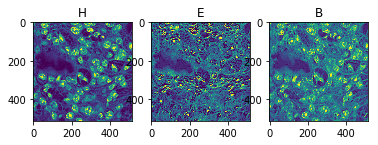

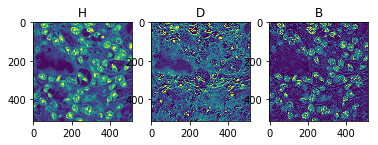

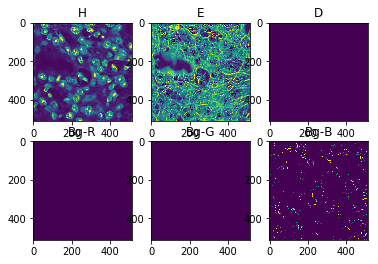

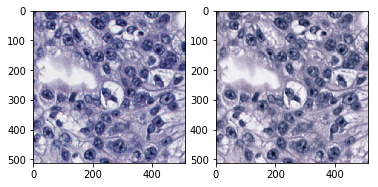

Saved model to ./models/deconv-GAN-512-40X-9/480_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 480 / 600 	 Time Taken: 105 sec
Train epoch 481
loss_G 1.432	loss_gan 0.806	loss_rec 0.626	image_loss 0.306	perceptual_loss 0.076	bg_penalty 0.045	stain_penalty 0.0	h_sparsity 0.169	e_penalty 0.201	cov_penalty -0.171	loss_D 0.085	
loss_G 1.413	loss_gan 0.779	loss_rec 0.633	image_loss 0.311	perceptual_loss 0.077	bg_penalty 0.046	stain_penalty 0.0	h_sparsity 0.166	e_penalty 0.196	cov_penalty -0.163	loss_D 0.083	
loss_G 1.374	loss_gan 0.754	loss_rec 0.62	image_loss 0.303	perceptual_loss 0.076	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.188	cov_penalty -0.154	loss_D 0.092	
Val epoch 481
loss_G 0.867	loss_gan 0.391	loss_rec 0.477	image_loss 0.179	perceptual_loss 0.078	bg_penalty 0.015	stain_penalty 0.0	h_sparsity 0.052	e_penalty 0.16	cov_penalty -0.008	loss_D 0.12	
learning rate 0.0001000 -> 0.0001000
End of epoch 481 / 600 	 Time Taken: 102 sec
Train epoch 482
loss

Val epoch 490
loss_G 1.298	loss_gan 0.83	loss_rec 0.468	image_loss 0.213	perceptual_loss 0.068	bg_penalty 0.015	stain_penalty 0.0	h_sparsity 0.063	e_penalty 0.126	cov_penalty -0.017	loss_D 0.066	
Saved model to ./models/deconv-GAN-512-40X-9/490_..._.pt
learning rate 0.0001000 -> 0.0001000
End of epoch 490 / 600 	 Time Taken: 104 sec
Train epoch 491
loss_G 1.434	loss_gan 0.803	loss_rec 0.63	image_loss 0.306	perceptual_loss 0.079	bg_penalty 0.047	stain_penalty 0.0	h_sparsity 0.161	e_penalty 0.189	cov_penalty -0.151	loss_D 0.082	
loss_G 1.389	loss_gan 0.757	loss_rec 0.632	image_loss 0.317	perceptual_loss 0.078	bg_penalty 0.042	stain_penalty 0.0	h_sparsity 0.157	e_penalty 0.179	cov_penalty -0.142	loss_D 0.082	
loss_G 1.37	loss_gan 0.737	loss_rec 0.633	image_loss 0.317	perceptual_loss 0.078	bg_penalty 0.043	stain_penalty 0.0	h_sparsity 0.158	e_penalty 0.181	cov_penalty -0.144	loss_D 0.091	
Val epoch 491
loss_G 1.31	loss_gan 0.719	loss_rec 0.591	image_loss 0.3	perceptual_loss 0.078	bg_penalt

loss_G 1.384	loss_gan 0.766	loss_rec 0.617	image_loss 0.303	perceptual_loss 0.074	bg_penalty 0.043	stain_penalty 0.0	h_sparsity 0.167	e_penalty 0.193	cov_penalty -0.163	loss_D 0.095	
Val epoch 500
loss_G 0.818	loss_gan 0.289	loss_rec 0.529	image_loss 0.207	perceptual_loss 0.076	bg_penalty 0.016	stain_penalty 0.0	h_sparsity 0.044	e_penalty 0.186	cov_penalty -0.0	loss_D 0.103	
tensor([[0.6982, 0.5946, 0.3988],
        [0.5660, 0.6945, 0.4442],
        [0.6130, 0.1343, 0.7786],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[0.4957, 0.0144],
        [0.4850, 0.0133],
        [0.4813, 0.0150]], device='cuda:0')


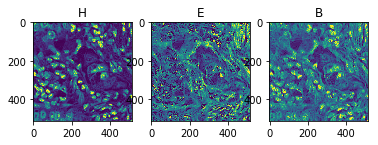

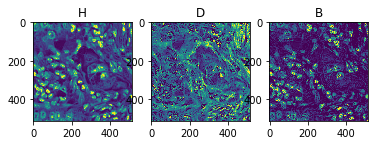

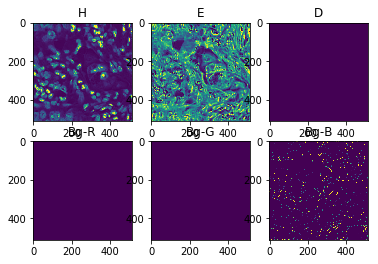

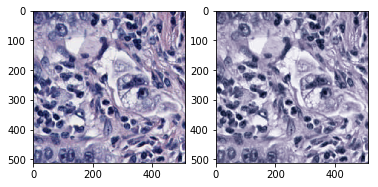

Saved model to ./models/deconv-GAN-512-40X-9/500_..._.pt
learning rate 0.0001000 -> 0.0000990
End of epoch 500 / 600 	 Time Taken: 106 sec
Train epoch 501
loss_G 1.363	loss_gan 0.748	loss_rec 0.615	image_loss 0.305	perceptual_loss 0.074	bg_penalty 0.042	stain_penalty 0.0	h_sparsity 0.157	e_penalty 0.171	cov_penalty -0.134	loss_D 0.1	
loss_G 1.337	loss_gan 0.708	loss_rec 0.629	image_loss 0.315	perceptual_loss 0.078	bg_penalty 0.043	stain_penalty 0.0	h_sparsity 0.158	e_penalty 0.174	cov_penalty -0.138	loss_D 0.108	
loss_G 1.343	loss_gan 0.708	loss_rec 0.635	image_loss 0.32	perceptual_loss 0.077	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.159	e_penalty 0.178	cov_penalty -0.143	loss_D 0.117	
Val epoch 501
loss_G 0.912	loss_gan 0.46	loss_rec 0.452	image_loss 0.173	perceptual_loss 0.069	bg_penalty 0.014	stain_penalty 0.0	h_sparsity 0.056	e_penalty 0.153	cov_penalty -0.013	loss_D 0.093	
learning rate 0.0000990 -> 0.0000980
End of epoch 501 / 600 	 Time Taken: 104 sec
Train epoch 502
loss_

Val epoch 510
loss_G 0.752	loss_gan 0.261	loss_rec 0.491	image_loss 0.225	perceptual_loss 0.078	bg_penalty 0.014	stain_penalty 0.0	h_sparsity 0.063	e_penalty 0.126	cov_penalty -0.015	loss_D 0.135	
Saved model to ./models/deconv-GAN-512-40X-9/510_..._.pt
learning rate 0.0000901 -> 0.0000891
End of epoch 510 / 600 	 Time Taken: 102 sec
Train epoch 511
loss_G 1.436	loss_gan 0.81	loss_rec 0.626	image_loss 0.314	perceptual_loss 0.076	bg_penalty 0.039	stain_penalty 0.0	h_sparsity 0.158	e_penalty 0.177	cov_penalty -0.138	loss_D 0.106	
loss_G 1.37	loss_gan 0.74	loss_rec 0.63	image_loss 0.315	perceptual_loss 0.077	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.159	e_penalty 0.179	cov_penalty -0.143	loss_D 0.117	
loss_G 1.366	loss_gan 0.737	loss_rec 0.629	image_loss 0.314	perceptual_loss 0.077	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.159	e_penalty 0.179	cov_penalty -0.144	loss_D 0.104	
Val epoch 511
loss_G 0.778	loss_gan 0.32	loss_rec 0.458	image_loss 0.18	perceptual_loss 0.081	bg_penalt

loss_G 1.413	loss_gan 0.772	loss_rec 0.641	image_loss 0.32	perceptual_loss 0.075	bg_penalty 0.042	stain_penalty 0.0	h_sparsity 0.161	e_penalty 0.19	cov_penalty -0.147	loss_D 0.095	
Val epoch 520
loss_G 1.203	loss_gan 0.736	loss_rec 0.467	image_loss 0.197	perceptual_loss 0.074	bg_penalty 0.013	stain_penalty 0.0	h_sparsity 0.058	e_penalty 0.136	cov_penalty -0.011	loss_D 0.08	
tensor([[0.6704, 0.6165, 0.4128],
        [0.4383, 0.7420, 0.5073],
        [0.8199, 0.1245, 0.5588],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[0.4733, 0.0105],
        [0.4714, 0.0105],
        [0.4584, 0.0116]], device='cuda:0')


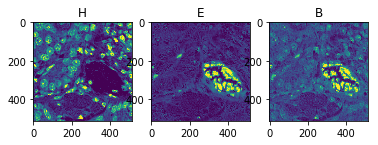

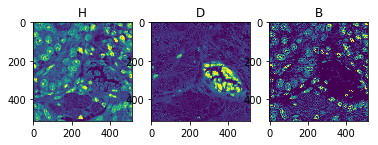

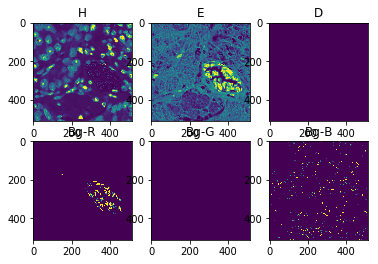

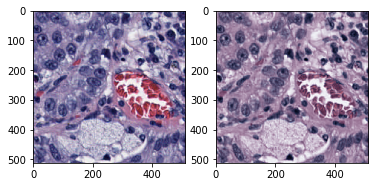

Saved model to ./models/deconv-GAN-512-40X-9/520_..._.pt
learning rate 0.0000802 -> 0.0000792
End of epoch 520 / 600 	 Time Taken: 104 sec
Train epoch 521
loss_G 1.418	loss_gan 0.767	loss_rec 0.651	image_loss 0.332	perceptual_loss 0.076	bg_penalty 0.043	stain_penalty 0.0	h_sparsity 0.157	e_penalty 0.176	cov_penalty -0.133	loss_D 0.091	
loss_G 1.42	loss_gan 0.759	loss_rec 0.66	image_loss 0.336	perceptual_loss 0.078	bg_penalty 0.042	stain_penalty 0.0	h_sparsity 0.161	e_penalty 0.183	cov_penalty -0.141	loss_D 0.089	
loss_G 1.402	loss_gan 0.762	loss_rec 0.64	image_loss 0.322	perceptual_loss 0.076	bg_penalty 0.041	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.188	cov_penalty -0.148	loss_D 0.091	
Val epoch 521
loss_G 0.749	loss_gan 0.303	loss_rec 0.445	image_loss 0.166	perceptual_loss 0.075	bg_penalty 0.019	stain_penalty 0.0	h_sparsity 0.057	e_penalty 0.143	cov_penalty -0.012	loss_D 0.123	
learning rate 0.0000792 -> 0.0000782
End of epoch 521 / 600 	 Time Taken: 103 sec
Train epoch 522
loss

Val epoch 530
loss_G 1.155	loss_gan 0.683	loss_rec 0.472	image_loss 0.208	perceptual_loss 0.075	bg_penalty 0.014	stain_penalty 0.0	h_sparsity 0.062	e_penalty 0.124	cov_penalty -0.011	loss_D 0.06	
Saved model to ./models/deconv-GAN-512-40X-9/530_..._.pt
learning rate 0.0000703 -> 0.0000693
End of epoch 530 / 600 	 Time Taken: 104 sec
Train epoch 531
loss_G 1.379	loss_gan 0.749	loss_rec 0.63	image_loss 0.31	perceptual_loss 0.075	bg_penalty 0.045	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.185	cov_penalty -0.147	loss_D 0.081	
loss_G 1.381	loss_gan 0.764	loss_rec 0.617	image_loss 0.3	perceptual_loss 0.074	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.163	e_penalty 0.188	cov_penalty -0.152	loss_D 0.076	
loss_G 1.413	loss_gan 0.793	loss_rec 0.62	image_loss 0.302	perceptual_loss 0.075	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.19	cov_penalty -0.155	loss_D 0.076	
Val epoch 531
loss_G 0.96	loss_gan 0.417	loss_rec 0.543	image_loss 0.214	perceptual_loss 0.088	bg_penalty 

loss_G 1.411	loss_gan 0.782	loss_rec 0.629	image_loss 0.308	perceptual_loss 0.078	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.16	e_penalty 0.183	cov_penalty -0.144	loss_D 0.082	
Val epoch 540
loss_G 1.044	loss_gan 0.61	loss_rec 0.433	image_loss 0.162	perceptual_loss 0.072	bg_penalty 0.015	stain_penalty 0.0	h_sparsity 0.061	e_penalty 0.138	cov_penalty -0.014	loss_D 0.085	
tensor([[0.6465, 0.6563, 0.3890],
        [0.3951, 0.7491, 0.5317],
        [0.8660, 0.1130, 0.4872],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[ 0.4185, -0.0032],
        [ 0.4176, -0.0017],
        [ 0.4258, -0.0023]], device='cuda:0')


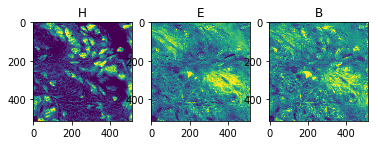

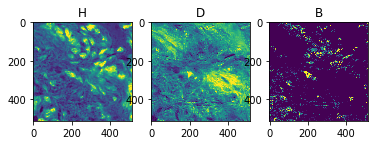

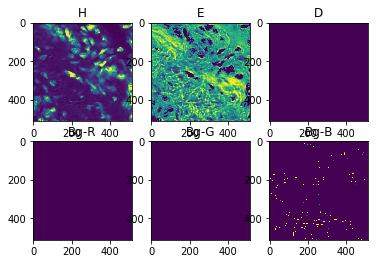

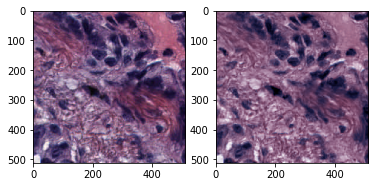

Saved model to ./models/deconv-GAN-512-40X-9/540_..._.pt
learning rate 0.0000604 -> 0.0000594
End of epoch 540 / 600 	 Time Taken: 106 sec
Train epoch 541
loss_G 1.454	loss_gan 0.818	loss_rec 0.637	image_loss 0.308	perceptual_loss 0.082	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.165	e_penalty 0.194	cov_penalty -0.157	loss_D 0.082	
loss_G 1.416	loss_gan 0.786	loss_rec 0.63	image_loss 0.31	perceptual_loss 0.078	bg_penalty 0.042	stain_penalty 0.0	h_sparsity 0.163	e_penalty 0.186	cov_penalty -0.15	loss_D 0.079	
loss_G 1.397	loss_gan 0.779	loss_rec 0.618	image_loss 0.302	perceptual_loss 0.077	bg_penalty 0.042	stain_penalty 0.0	h_sparsity 0.162	e_penalty 0.186	cov_penalty -0.151	loss_D 0.083	
Val epoch 541
loss_G 0.765	loss_gan 0.297	loss_rec 0.468	image_loss 0.182	perceptual_loss 0.074	bg_penalty 0.015	stain_penalty 0.0	h_sparsity 0.052	e_penalty 0.155	cov_penalty -0.01	loss_D 0.143	
learning rate 0.0000594 -> 0.0000584
End of epoch 541 / 600 	 Time Taken: 104 sec
Train epoch 542
loss_

Val epoch 550
loss_G 0.863	loss_gan 0.38	loss_rec 0.483	image_loss 0.187	perceptual_loss 0.079	bg_penalty 0.017	stain_penalty 0.0	h_sparsity 0.054	e_penalty 0.155	cov_penalty -0.008	loss_D 0.098	
Saved model to ./models/deconv-GAN-512-40X-9/550_..._.pt
learning rate 0.0000505 -> 0.0000495
End of epoch 550 / 600 	 Time Taken: 104 sec
Train epoch 551
loss_G 1.48	loss_gan 0.823	loss_rec 0.657	image_loss 0.328	perceptual_loss 0.076	bg_penalty 0.047	stain_penalty 0.0	h_sparsity 0.166	e_penalty 0.201	cov_penalty -0.161	loss_D 0.093	
loss_G 1.407	loss_gan 0.779	loss_rec 0.629	image_loss 0.304	perceptual_loss 0.076	bg_penalty 0.045	stain_penalty 0.0	h_sparsity 0.164	e_penalty 0.197	cov_penalty -0.158	loss_D 0.085	
loss_G 1.395	loss_gan 0.767	loss_rec 0.628	image_loss 0.305	perceptual_loss 0.077	bg_penalty 0.045	stain_penalty 0.0	h_sparsity 0.163	e_penalty 0.196	cov_penalty -0.158	loss_D 0.088	
Val epoch 551
loss_G 1.048	loss_gan 0.568	loss_rec 0.481	image_loss 0.188	perceptual_loss 0.074	bg_pe

loss_G 1.346	loss_gan 0.731	loss_rec 0.615	image_loss 0.294	perceptual_loss 0.078	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.157	e_penalty 0.186	cov_penalty -0.145	loss_D 0.094	
Val epoch 560
loss_G 0.781	loss_gan 0.295	loss_rec 0.486	image_loss 0.193	perceptual_loss 0.076	bg_penalty 0.016	stain_penalty 0.0	h_sparsity 0.053	e_penalty 0.162	cov_penalty -0.014	loss_D 0.157	
tensor([[0.5879, 0.6745, 0.4466],
        [0.3372, 0.7568, 0.5600],
        [0.9341, 0.0858, 0.3466],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[ 0.4530, -0.0011],
        [ 0.4702, -0.0011],
        [ 0.4308, -0.0023]], device='cuda:0')


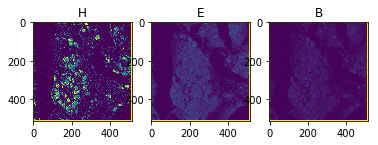

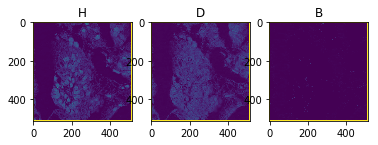

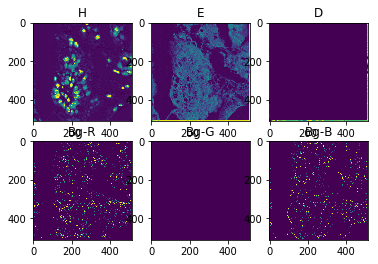

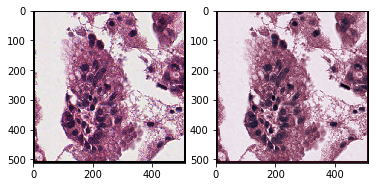

Saved model to ./models/deconv-GAN-512-40X-9/560_..._.pt
learning rate 0.0000406 -> 0.0000396
End of epoch 560 / 600 	 Time Taken: 105 sec
Train epoch 561
loss_G 1.482	loss_gan 0.802	loss_rec 0.68	image_loss 0.341	perceptual_loss 0.079	bg_penalty 0.053	stain_penalty 0.0	h_sparsity 0.161	e_penalty 0.2	cov_penalty -0.154	loss_D 0.081	
loss_G 1.393	loss_gan 0.758	loss_rec 0.636	image_loss 0.315	perceptual_loss 0.076	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.161	e_penalty 0.19	cov_penalty -0.151	loss_D 0.08	
loss_G 1.375	loss_gan 0.754	loss_rec 0.621	image_loss 0.304	perceptual_loss 0.076	bg_penalty 0.043	stain_penalty 0.0	h_sparsity 0.159	e_penalty 0.188	cov_penalty -0.149	loss_D 0.086	
Val epoch 561
loss_G 1.006	loss_gan 0.527	loss_rec 0.479	image_loss 0.194	perceptual_loss 0.079	bg_penalty 0.015	stain_penalty 0.0	h_sparsity 0.054	e_penalty 0.146	cov_penalty -0.009	loss_D 0.099	
learning rate 0.0000396 -> 0.0000386
End of epoch 561 / 600 	 Time Taken: 103 sec
Train epoch 562
loss_G

Val epoch 570
loss_G 1.118	loss_gan 0.679	loss_rec 0.438	image_loss 0.171	perceptual_loss 0.07	bg_penalty 0.016	stain_penalty 0.0	h_sparsity 0.057	e_penalty 0.138	cov_penalty -0.014	loss_D 0.083	
Saved model to ./models/deconv-GAN-512-40X-9/570_..._.pt
learning rate 0.0000307 -> 0.0000297
End of epoch 570 / 600 	 Time Taken: 105 sec
Train epoch 571
loss_G 1.339	loss_gan 0.732	loss_rec 0.607	image_loss 0.283	perceptual_loss 0.077	bg_penalty 0.045	stain_penalty 0.0	h_sparsity 0.157	e_penalty 0.192	cov_penalty -0.147	loss_D 0.101	
loss_G 1.351	loss_gan 0.736	loss_rec 0.615	image_loss 0.296	perceptual_loss 0.077	bg_penalty 0.043	stain_penalty 0.0	h_sparsity 0.161	e_penalty 0.193	cov_penalty -0.155	loss_D 0.092	
loss_G 1.349	loss_gan 0.736	loss_rec 0.613	image_loss 0.293	perceptual_loss 0.077	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.161	e_penalty 0.192	cov_penalty -0.155	loss_D 0.094	
Val epoch 571
loss_G 0.782	loss_gan 0.328	loss_rec 0.453	image_loss 0.184	perceptual_loss 0.076	bg_p

loss_G 1.378	loss_gan 0.756	loss_rec 0.621	image_loss 0.301	perceptual_loss 0.078	bg_penalty 0.045	stain_penalty 0.0	h_sparsity 0.159	e_penalty 0.186	cov_penalty -0.148	loss_D 0.08	
Val epoch 580
loss_G 0.934	loss_gan 0.479	loss_rec 0.456	image_loss 0.168	perceptual_loss 0.076	bg_penalty 0.016	stain_penalty 0.0	h_sparsity 0.056	e_penalty 0.148	cov_penalty -0.009	loss_D 0.09	
tensor([[0.6704, 0.6287, 0.3940],
        [0.4647, 0.7355, 0.4931],
        [0.7726, 0.1194, 0.6236],
        [0.0000, 0.7071, 0.7071],
        [0.7071, 0.0000, 0.7071],
        [0.7071, 0.7071, 0.0000]], device='cuda:0')
tensor([[0.5205, 0.0040],
        [0.5049, 0.0029],
        [0.4994, 0.0008]], device='cuda:0')


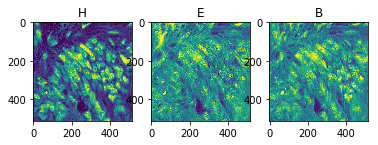

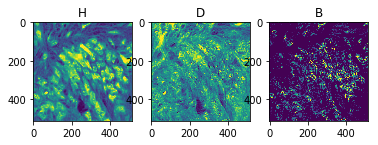

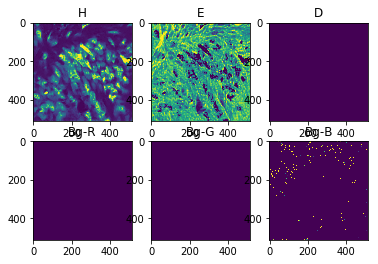

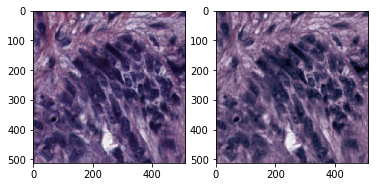

Saved model to ./models/deconv-GAN-512-40X-9/580_..._.pt
learning rate 0.0000208 -> 0.0000198
End of epoch 580 / 600 	 Time Taken: 105 sec
Train epoch 581
loss_G 1.462	loss_gan 0.814	loss_rec 0.648	image_loss 0.323	perceptual_loss 0.075	bg_penalty 0.048	stain_penalty 0.0	h_sparsity 0.166	e_penalty 0.197	cov_penalty -0.16	loss_D 0.077	
loss_G 1.411	loss_gan 0.787	loss_rec 0.624	image_loss 0.304	perceptual_loss 0.074	bg_penalty 0.046	stain_penalty 0.0	h_sparsity 0.165	e_penalty 0.196	cov_penalty -0.16	loss_D 0.08	
loss_G 1.396	loss_gan 0.774	loss_rec 0.622	image_loss 0.301	perceptual_loss 0.075	bg_penalty 0.046	stain_penalty 0.0	h_sparsity 0.163	e_penalty 0.194	cov_penalty -0.158	loss_D 0.082	
Val epoch 581
loss_G 0.882	loss_gan 0.42	loss_rec 0.462	image_loss 0.185	perceptual_loss 0.074	bg_penalty 0.015	stain_penalty 0.0	h_sparsity 0.056	e_penalty 0.141	cov_penalty -0.007	loss_D 0.115	
learning rate 0.0000198 -> 0.0000188
End of epoch 581 / 600 	 Time Taken: 104 sec
Train epoch 582
loss_

Val epoch 590
loss_G 1.109	loss_gan 0.645	loss_rec 0.464	image_loss 0.171	perceptual_loss 0.08	bg_penalty 0.014	stain_penalty 0.0	h_sparsity 0.054	e_penalty 0.151	cov_penalty -0.006	loss_D 0.097	
Saved model to ./models/deconv-GAN-512-40X-9/590_..._.pt
learning rate 0.0000109 -> 0.0000099
End of epoch 590 / 600 	 Time Taken: 103 sec
Train epoch 591
loss_G 1.407	loss_gan 0.781	loss_rec 0.626	image_loss 0.3	perceptual_loss 0.078	bg_penalty 0.044	stain_penalty 0.0	h_sparsity 0.161	e_penalty 0.195	cov_penalty -0.152	loss_D 0.071	
loss_G 1.407	loss_gan 0.777	loss_rec 0.63	image_loss 0.308	perceptual_loss 0.076	bg_penalty 0.043	stain_penalty 0.0	h_sparsity 0.163	e_penalty 0.198	cov_penalty -0.159	loss_D 0.075	
loss_G 1.433	loss_gan 0.793	loss_rec 0.639	image_loss 0.314	perceptual_loss 0.076	bg_penalty 0.045	stain_penalty 0.0	h_sparsity 0.163	e_penalty 0.199	cov_penalty -0.157	loss_D 0.073	
Val epoch 591
loss_G 0.948	loss_gan 0.493	loss_rec 0.454	image_loss 0.168	perceptual_loss 0.077	bg_pena

In [14]:
for epoch in range(0, model.n_epochs + model.n_epochs_decay): 
    epoch_start_time = time.time()
    
    hist_epoch = train(model, train_loader, epoch, loss_names)
    for loss_name in loss_names:
        if isinstance(hist_epoch[loss_name], dict):
            if hist[loss_name] == []:
                hist[loss_name] = dict()
                for key in list(hist_epoch[loss_name].keys()):
                    hist[loss_name][key] = []
            for key in list(hist_epoch[loss_name].keys()):
                hist[loss_name][key].append(hist_epoch[loss_name][key])
        else:
            hist[loss_name].append(hist_epoch[loss_name])
    
    hist_epoch = val(model, val_loader, epoch, loss_names)
    for loss_name in loss_names:
        if isinstance(hist_epoch[loss_name], dict):
            if hist[loss_name+"_val"] == []:
                hist[loss_name+"_val"] = dict()
                for key in list(hist_epoch[loss_name].keys()):
                    hist[loss_name+"_val"][key] = []
            for key in list(hist_epoch[loss_name].keys()):
                hist[loss_name+"_val"][key].append(hist_epoch[loss_name][key])
        else:
            hist[loss_name+"_val"].append(hist_epoch[loss_name])
        
    # Plot
    if epoch % 20 == 0:     
        images = model.images
        ODs = model.ODs
        recon_images = model.recon_images_exact
        print(model.stain_OD_norm_preds[0])
        print(model.params_lt)
        
        ori_image = np.transpose(np.array(images.detach().cpu().numpy()*255, dtype=np.uint8), (0, 2, 3, 1))[0]
        _, ch1, ch2, ch3 = channel_deconvolution(ori_image, "HEB", to_normalize=False)
        plt.subplot(131)
        plt.title("H")
        plt.imshow(np.clip(ch1, 0, np.quantile(ch1, 0.99)))
        plt.subplot(132)
        plt.title("E")
        plt.imshow(np.clip(ch2, 0, np.quantile(ch2, 0.99)))
        plt.subplot(133)
        plt.title("B")
        plt.imshow(np.clip(ch3, 0, np.quantile(ch3, 0.99)))
        plt.show()

        ori_image = np.transpose(np.array(images.detach().cpu().numpy()*255, dtype=np.uint8), (0, 2, 3, 1))[0]
        _, ch1, ch2, ch3 = channel_deconvolution(ori_image, "HDB", to_normalize=False)
        plt.subplot(131)
        plt.title("H")
        plt.imshow(np.clip(ch1, 0, np.quantile(ch1, 0.99)))
        plt.subplot(132)
        plt.title("D")
        plt.imshow(np.clip(ch2, 0, np.quantile(ch2, 0.99)))
        plt.subplot(133)
        plt.title("B")
        plt.imshow(np.clip(ch3, 0, np.quantile(ch3, 0.99)))
        plt.show()

        plt.subplot(231)
        plt.title("H")
        img_temp = ODs[0, 0, ...].detach().cpu().numpy()
        plt.imshow(np.clip(img_temp, None, np.quantile(img_temp, 0.99)))
        plt.subplot(232)
        plt.title("E")
        img_temp = ODs[0, 1, ...].detach().cpu().numpy()
        plt.imshow(np.clip(img_temp, None, np.quantile(img_temp, 0.99)))
        plt.subplot(233)
        plt.title("D")
        img_temp = ODs[0, 2, ...].detach().cpu().numpy()
        plt.imshow(np.clip(img_temp, None, np.quantile(img_temp, 0.99)))
        plt.subplot(234)
        plt.title("Bg-R")
        img_temp = ODs[0, 3, ...].detach().cpu().numpy()
        plt.imshow(np.clip(img_temp, None, np.quantile(img_temp, 0.99)))
        plt.subplot(235)
        plt.title("Bg-G")
        img_temp = ODs[0, 4, ...].detach().cpu().numpy()
        plt.imshow(np.clip(img_temp, None, np.quantile(img_temp, 0.99)))
        plt.subplot(236)
        plt.title("Bg-B")
        img_temp = ODs[0, 5, ...].detach().cpu().numpy()
        plt.imshow(np.clip(img_temp, None, np.quantile(img_temp, 0.99)))
        plt.show()
        plt.subplot(121)
        plt.imshow(np.transpose(np.array(images.cpu().numpy()*255, dtype=np.uint8), (0, 2, 3, 1))[0])
        plt.subplot(122)
        plt.imshow(np.transpose(np.array(recon_images.detach().cpu().numpy()*255, dtype=np.uint8), (0, 2, 3, 1))[0])
        plt.show()
    
    # Save model
    if epoch % 5 == 0:
        model.save_networks(epoch)
        print("Saved model to {}".format(os.path.join(model_dir, str(epoch)+"_..._.pt")))
        
    model.update_learning_rate()

    print('End of epoch %d / %d \t Time Taken: %d sec' %
          (epoch, model.n_epochs + model.n_epochs_decay, time.time() - epoch_start_time))

In [15]:
model.save_networks(epoch)
print("Saved model to {}".format(os.path.join(model_dir, str(epoch)+"_..._.pt")))
torch.save(hist, os.path.join(model_dir, "hist.pt"))

Saved model to ./models/deconv-GAN-512-40X-9/599_..._.pt


### Plot learning curve

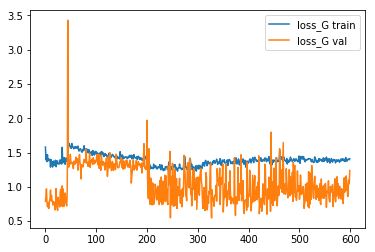

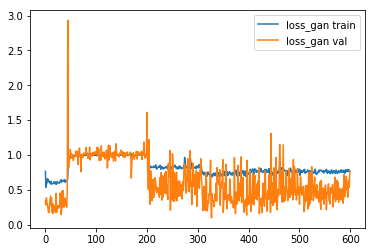

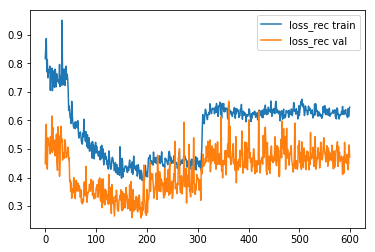

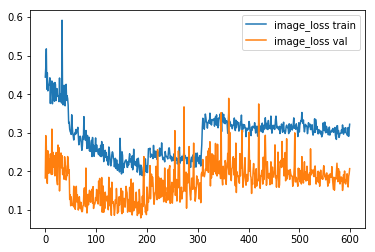

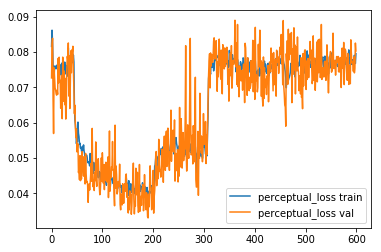

...

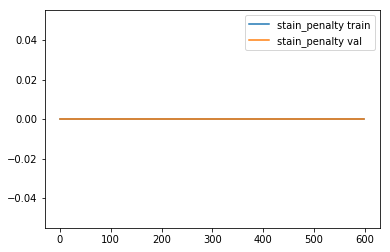

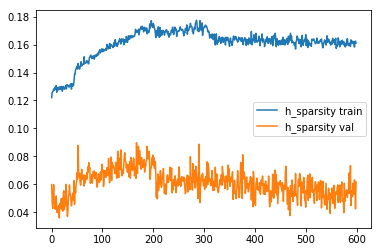

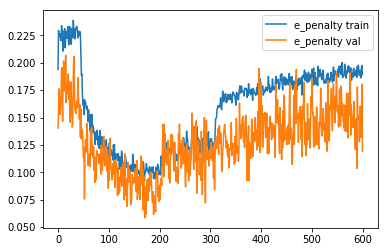

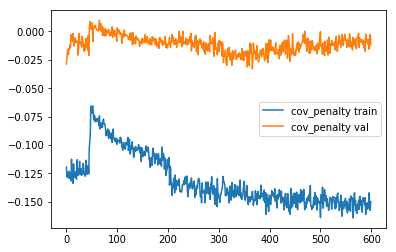

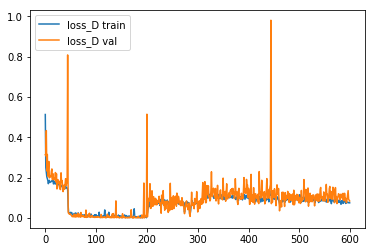

In [16]:
for loss_name in loss_names:
    loss = hist[loss_name]
    if isinstance(loss, dict):
        for key in list(loss.keys()):
            plt.plot(np.arange(len(hist[loss_name][key])), hist[loss_name][key], label=loss_name+" "+key+" train")
            plt.plot(np.arange(len(hist[loss_name][key])), hist[loss_name+"_val"][key], label=loss_name+" "+key+" val")
            plt.legend()
            plt.show()
    else:
        plt.plot(np.arange(len(hist[loss_name])), hist[loss_name], label=loss_name+" train")
        plt.plot(np.arange(len(hist[loss_name])), hist[loss_name+"_val"], label=loss_name+" val")
        plt.legend()
        plt.show()

# Session Info

In [1]:
!pip freeze

absl-py==0.7.0
altair==3.2.0
argh==0.26.2
astor==0.7.1
astropy==3.2.1
atomicwrites==1.3.0
attrs==19.1.0
autograd==1.2
backcall==0.1.0
base58==1.0.3
bleach==1.5.0
blinker==1.4
boto3==1.10.15
botocore==1.13.15
Bottleneck==1.2.1
cachetools==4.1.0
certifi==2019.3.9
chardet==3.0.4
Click==7.0
cvxopt==1.2.3
cvxpy==1.0.24
cycler==0.10.0
Cython==0.29.15
decorator==4.4.0
defusedxml==0.5.0
dill==0.2.9
docutils==0.15.2
ecos==2.0.7.post1
entrypoints==0.3
enum-compat==0.0.3
environment-kernels==1.1.1
FITS-tools==0.2
future==0.17.1
gast==0.2.2
google-auth==1.14.3
google-auth-oauthlib==0.4.1
google-pasta==0.2.0
grpcio==1.29.0
h5py==2.10.0
html5lib==0.9999999
idna==2.8
image-registration==0.2.4
imageio==2.6.1
importlib-metadata==0.23
ipykernel==5.1.0
ipython==7.4.0
ipython-genutils==0.2.0
ipywidgets==7.4.2
isodate==0.6.0
jedi==0.13.3
Jinja2==2.10.1
jmespath==0.9.4
jsonschema==3.0.1
jupyter==1.0.0
jupyter-client==5.2.4
jupyter-console==6.0.0
jupyter-core==4.4.0
Keras==2.3.1
Keras-Applications==1.0.8
Ker